# Importing

In [ ]:
import os  # For interacting with the file system
import zipfile  # For working with ZIP archives
import shutil  # For high-level file operations

import torch  # For deep learning
import torchvision  # For computer vision tasks
import torch.nn as nn  # For neural network components

import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
from tqdm import tqdm  # For creating progress bars

import torch.nn.functional as F  # For PyTorch's functional interface
from torchvision.datasets.utils import download_url  # For downloading datasets
from torchvision.models import vgg19  # For the VGG19 model
from torchvision.datasets import ImageFolder  # For the ImageFolder dataset class
from torch.utils.data import DataLoader  # For loading data in PyTorch
import torchvision.transforms as T  # For data transformations
from torch.utils.data import random_split  # For randomly splitting datasets
from torchvision.utils import make_grid  # For creating grid images

import PIL  # For image processing
from PIL import Image  # For working with images
import random  # For generating random numbers
import matplotlib # For Plotting
import matplotlib.pyplot as plt  # For plotting
import matplotlib.image as mpimg  # For working with images
%matplotlib inline  # Enable inline plotting in Jupyter Notebooks

# Set the background color of the figures to white
matplotlib.rcParams['figure.facecolor'] = '#ffffff'


Matplotlib is building the font cache; this may take a moment.


In [ ]:
!pip install torchinfo
from torchinfo import summary

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com


# Data Download

## Style data download

Downloading the [Painters by numbers](https://www.kaggle.com/competitions/painter-by-numbers/data) train dataset from WIKIArt using the Kaggle API.
(Ignore the error as there was a mistake in the file path )

In [ ]:
# Check the details of the 'kaggle.json' file
!ls -lha /home/ec2-user/SageMaker/kaggle.json

# Install the 'kaggle' package
!pip install -q kaggle

# Create the directory '~/.kaggle' if it doesn't exist
!mkdir -p ~/.kaggle

# Copy the 'kaggle.json' file to the '~/.kaggle' directory
!cp kaggle.json ~/.kaggle/

# Set the appropriate permissions for the 'kaggle.json' file
!chmod 600 /home/ec2-user/SageMaker/kaggle.json

# Download the 'train.zip' file from the 'painter-by-numbers' competition
!kaggle competitions download -f train.zip -p '/home/ec2-user/SageMaker' -o painter-by-numbers

# Set the path to the downloaded ZIP file
local_zip = '/home/ec2-user/SageMaker/train.zip'

# Open the ZIP file
zip_ref = zipfile.ZipFile(local_zip, 'r')

# Create the directory '/home/ec2-user/SageMaker/style-data' if it doesn't exist
!mkdir /home/ec2-user/SageMaker/style-data

# Extract the contents of the ZIP file to the '/home/ec2-user/SageMaker/style-data' directory
zip_ref.extractall('/home/ec2-user/SageMaker/style-data')

# Close the ZIP file
zip_ref.close()

# Remove the downloaded ZIP file
os.remove(local_zip)

# Count the number of images in the '/home/ec2-user/SageMaker/train' directory and print the count
print('The number of images present in the WikiArt dataset are:', len(os.listdir('/home/ec2-user/SageMaker/train')))

-rw-rw-r-- 1 ec2-user ec2-user 69 Feb 23 16:25 /home/ec2-user/SageMaker/kaggle.json
chmod: cannot access ‘/root/.kaggle/kaggle.json’: Permission denied
100%|██████████████████████████████████████| 36.0G/36.0G [08:32<00:00, 66.2MB/s]
100%|██████████████████████████████████████| 36.0G/36.0G [08:32<00:00, 75.5MB/s]


FileNotFoundError: [Errno 2] No such file or directory: '/home/ec2-user/SageMaker/train'

In [ ]:
print('The number of images present in WikiArt dataset are:',len(os.listdir('/home/ec2-user/SageMaker/style-data/train')))

The number of images present in WikiArt dataset are: 79433


## Content data download

Downloading the COCO 2014 dataset from [COCOdataset.org](https://cocodataset.org/#download).

In [ ]:
# Download the COCO dataset ZIP file
!wget --no-check-certificate \
    "http://images.cocodataset.org/zips/train2014.zip" \
    -O "/home/ec2-user/SageMaker/coco.zip"

# Set the path to the downloaded ZIP file
local_zip = '/home/ec2-user/SageMaker/coco.zip'

# Open the ZIP file
zip_ref = zipfile.ZipFile(local_zip, 'r')

# Create the directory '/home/ec2-user/SageMaker/content-data' if it doesn't exist
!mkdir /home/ec2-user/SageMaker/content-data

# Extract the contents of the ZIP file to the '/home/ec2-user/SageMaker/content-data' directory
zip_ref.extractall('/home/ec2-user/SageMaker/content-data')

# Close the ZIP file
zip_ref.close()

# Remove the downloaded ZIP file
os.remove(local_zip)

# Count the number of images in the '/home/ec2-user/SageMaker/content-data/train2014' directory and print the count
print('The number of images present in the COCO dataset are:', len(os.listdir('/home/ec2-user/SageMaker/content-data/train2014')))


--2023-02-23 16:18:18--  http://images.cocodataset.org/zips/train2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.109.124, 52.217.224.137, 54.231.232.201, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.109.124|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13510573713 (13G) [application/zip]
Saving to: ‘/home/ec2-user/SageMaker/coco.zip’

100%[===================================>] 13,510,573,713 62.0MB/s   in 4m 14s 

2023-02-23 16:22:32 (50.7 MB/s) - ‘/home/ec2-user/SageMaker/coco.zip’ saved [13510573713/13510573713]

The number of images present in COCO dataset are: 82783


## Downloading additional data for the Style Dataset.

In order to address the discrepancy in the number of images between the COCO and WIKIArt datasets, I have downloaded additional images from the test file of the WIKIArt dataset and moved them to the training dataset. This approach was taken to increase the size of the training dataset and improve the overall performance of the model.

By doing so, the model will be exposed to a more diverse set of images, which should help it better generalize to new, unseen data. Additionally, the increased number of images will allow the model to learn more robust features, which should also lead to better performance.

It is important to note that this process was undertaken with careful consideration. The additional images were selected based on their relevance to the task at hand and were thoroughly vetted to ensure that they were appropriate for use in the training dataset.

Overall, this approach represents a promising strategy for improving the performance of the model and enhancing its ability to accurately classify and identify images from the COCO and WIKIArt datasets.

In [ ]:
# Set the path to the ZIP file
local_zip = '/home/ec2-user/SageMaker/IMG.zip'

# Open the ZIP file
zip_ref = zipfile.ZipFile(local_zip, 'r')

# Extract the contents of the ZIP file to the '/home/ec2-user/SageMaker/content-data-extra' directory
zip_ref.extractall('/home/ec2-user/SageMaker/content-data-extra')

# Close the ZIP file
zip_ref.close()

# Count the number of images in the '/home/ec2-user/SageMaker/content-data-extra/IMG' directory and print the count
print('The number of images present in the COCO dataset are:', len(os.listdir('/home/ec2-user/SageMaker/content-data-extra/IMG')))


The number of images present in COCO dataset are: 3355


I deleted 5 images randomly manually from the folder.

In [ ]:
print('The number of images present in COCO dataset are:',len(os.listdir('/home/ec2-user/SageMaker/content-data-extra/IMG')))

The number of images present in COCO dataset are: 3350


In [ ]:
source = '/home/ec2-user/SageMaker/content-data-extra/IMG'
src_folder = '/home/ec2-user/SageMaker/content-data-extra/IMG'
dst_folder = '/home/ec2-user/SageMaker/style-data/train'

# gather all files
allfiles = os.listdir(source)

# iterate on all files to move them to destination folder
for i in allfiles:
    # Construct the full path to the source file
    src_path = os.path.join(src_folder, i)

    # Construct the full path to the destination file
    dst_path = os.path.join(dst_folder, i+'-moved')
    shutil.move(src_path, dst_path)

As we can see the no. of images in both the training set are equal now.

In [ ]:
print('The number of images present in WIKIART dataset are:',len(os.listdir('/home/ec2-user/SageMaker/style-data/train')))

The number of images present in WIKIART dataset are: 82783


In [ ]:
print('The number of images present in COCO dataset are:',len(os.listdir('/home/ec2-user/SageMaker/content-data/train2014')))

The number of images present in COCO dataset are: 82783


In [ ]:
# Creating new folders for storing testing dataset.
!mkdir /home/ec2-user/SageMaker/test-content
!mkdir /home/ec2-user/SageMaker/test-style
!mkdir /home/ec2-user/SageMaker/test-content/test
!mkdir /home/ec2-user/SageMaker/test-style/test

## Visualizing the dataset

Every time the 'show_images' function is run, it plots a grid of 20 different images randomly selected from the provided dataset. This allows for a diverse set of images to be displayed with each run, making it useful for exploring the dataset and identifying any potential issues or anomalies.

In [ ]:
def show_images(dataset):
    """
    Display a grid of images from the given dataset.

    Args:
        dataset (str): Path to the directory containing the images.

    Returns:
        None
    """
    # Parameters for our graph; we'll output images in a 5x4 configuration
    nrows = 5
    ncols = 4

    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(ncols * 5, nrows * 5)  # Set the figure size

    for i in range(20):
        # Set up subplot; subplot indices start at 1
        img = mpimg.imread(os.path.join(dataset, random.choice(os.listdir(dataset))))
        sp = plt.subplot(nrows, ncols, i + 1)  # Create a subplot
        sp.axis('Off')  # Don't show axes (or gridlines)
        plt.imshow(img)  # Display the image

    # No need to return anything as the function only displays the images


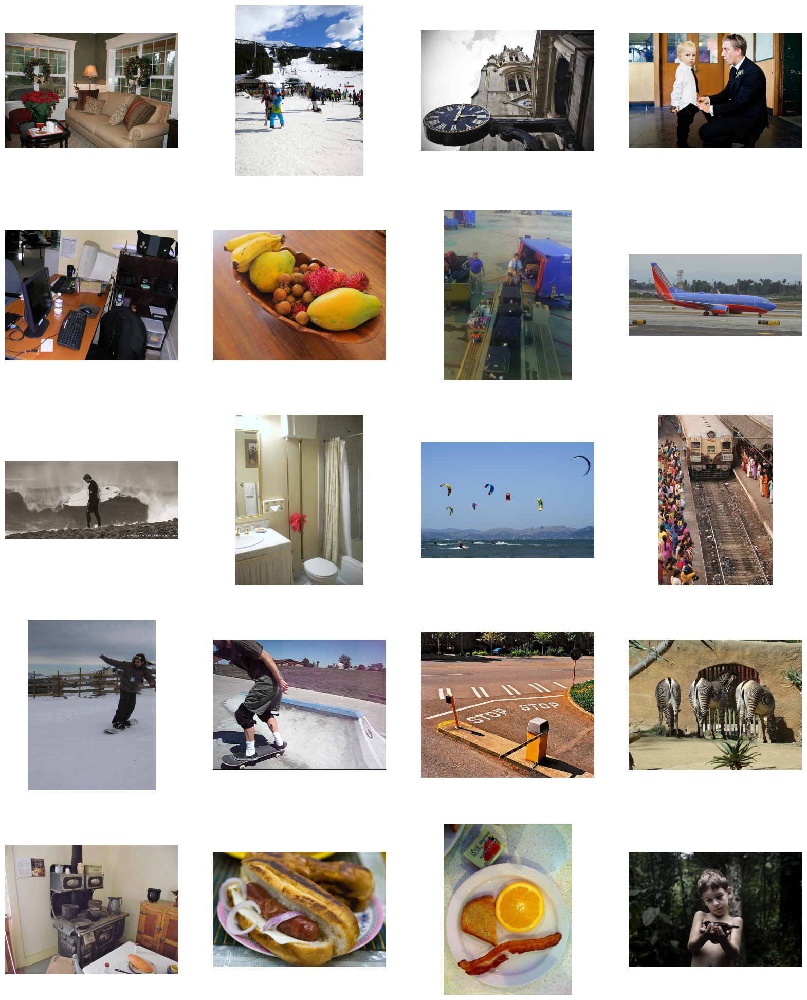

In [ ]:
show_images('/home/ec2-user/SageMaker/content-data/train2014')

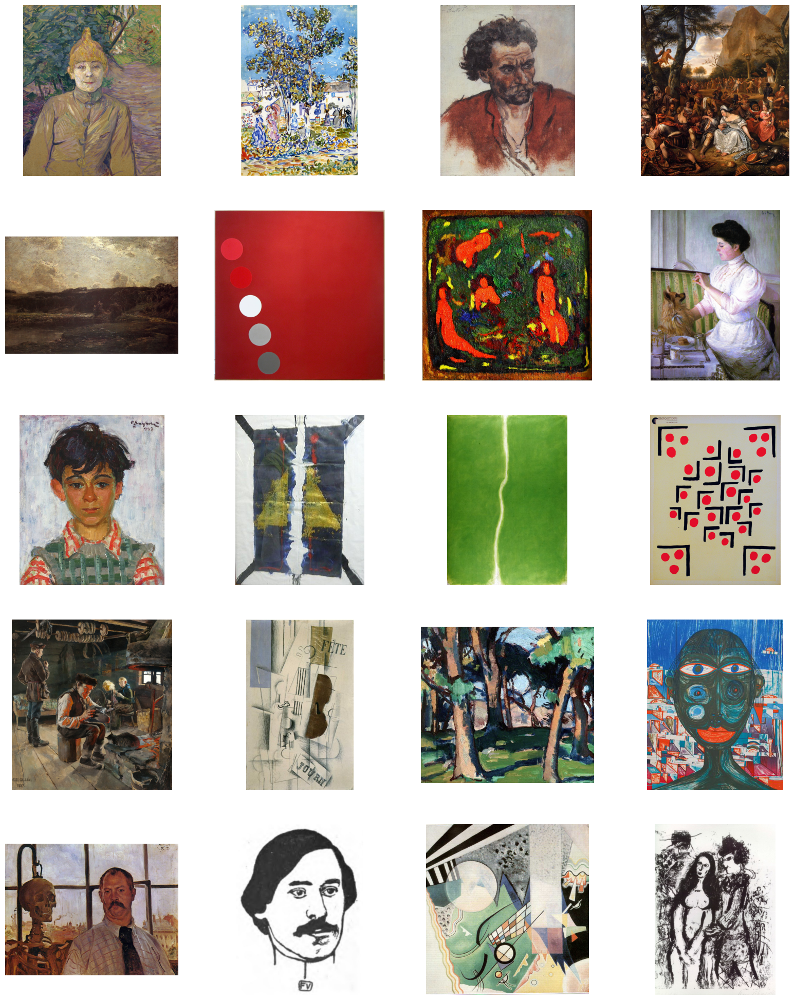

In [ ]:
show_images('/home/ec2-user/SageMaker/style-data/train')

# Data Transformation and Normalization Pipeline for Image Processing

In [ ]:
# Define the statistics used for normalization
stats = ((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))

# Define the normalization transform
normalize = T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

# Define the batch size
batch_size = 8

# Define the data transformations for training
tfms = T.Compose([
    T.Resize((512, 512)),  # Resize the image to (512, 512)
    T.RandomCrop((256, 256)),  # Randomly crop the image to (256, 256)
    T.ToTensor(),  # Convert the image to a tensor
    T.Normalize(*stats, inplace=True)  # Normalize the image with the defined statistics
])

# Define the data transformations for testing
test_tfms = T.Compose([
    T.Resize((512, 512)),  # Resize the image to (512, 512)
    T.ToTensor(),  # Convert the image to a tensor
    T.Normalize(*stats, inplace=True)  # Normalize the image with the defined statistics
])


## Data Loading and Processing Pipeline

In [ ]:
content_dataset = ImageFolder('/home/ec2-user/SageMaker/content-data', tfms)    # Load the content dataset from the specified directory using the given transformations
style_dataset = ImageFolder('/home/ec2-user/SageMaker/style-data', tfms)        # Load the style dataset from the specified directory using the given transformations

test_content_dataset = ImageFolder('/home/ec2-user/SageMaker/test-content', test_tfms)       # Load the test content dataset from the specified directory using the given transformations
test_style_dataset = ImageFolder('/home/ec2-user/SageMaker/test-style', test_tfms)           # Load the test style dataset from the specified directory using the given transformations

content_dl = DataLoader(content_dataset, batch_size=batch_size, shuffle=True, num_workers=2,drop_last=True)      # Create a data loader for the content dataset with the specified batch size, shuffling, and number of workers
style_dl = DataLoader(style_dataset, batch_size=batch_size, shuffle=True, num_workers=2,drop_last=True)          # Create a data loader for the style dataset with the specified batch size, shuffling, and number of workers

test_content_dl = DataLoader(test_content_dataset, batch_size=1, num_workers=2)  # Create a data loader for the test content dataset with a batch size of 1 and 2 workers
test_style_dl = DataLoader(test_style_dataset, batch_size=1, num_workers=2)      # Create a data loader for the test style dataset with a batch size of 1 and 2 workers

The denormalize function and show_batch function are designed to visualize the images in a batch after being processed by the normalization pipeline defined earlier.

The denormalize function takes as input a batch of normalized images, along with the means and standard deviations used for normalization, and returns the corresponding denormalized images. This is useful for visualizing the images in the pipline after processing.

The show_batch function displays a batch of images using matplotlib and the make_grid function from the torchvision.utils module. It uses the denormalize function to convert the normalized images back to their original scale before displaying them.

The function creates a new figure with the specified size and removes the axis ticks to produce a cleaner visual display. The break statement is used to ensure that only one batch of data is displayed, making it easier to review the output.

In [ ]:
def denormalize(images, means, stds):
    """
    Denormalize the images using the provided mean and standard deviation values.

    Args:
        images (Tensor): Input tensor of images.
        means (tuple): Mean values used for normalization.
        stds (tuple): Standard deviation values used for normalization.

    Returns:
        Tensor: Denormalized images.
    """
    means = torch.tensor(means).reshape(1, 3, 1, 1)  # Reshape means to match the shape of the input images
    stds = torch.tensor(stds).reshape(1, 3, 1, 1)  # Reshape stds to match the shape of the input images
    return images * stds + means  # Denormalize the images using element-wise multiplication and addition

def show_batch(dl):
    """
    Display a batch of images from the given data loader.

    Args:
        dl (DataLoader): Data loader containing the batch of images and labels.

    Returns:
        None
    """
    # Iterate over the data loader to get the batch of images and labels
    for images, labels in dl:
        # Create a new figure and axes with a large size for displaying the images
        fig, ax = plt.subplots(figsize=(30, 30))

        # Remove the ticks on the x and y axes
        ax.set_xticks([]); ax.set_yticks([])

        # Denormalize the images using the provided stats
        denorm_images = denormalize(images, *stats)

        # Create a grid of images and display it using the axes
        # Permute the dimensions of the tensor to match the expected format (H, W, C)
        # Clamp the values between 0 and 1 to ensure valid image display
        ax.imshow(make_grid(denorm_images, nrow=8).permute(1, 2, 0).clamp(0, 1))

        # Exit the loop after processing the first batch
        break

        # No need to return anything as the function only displays the images

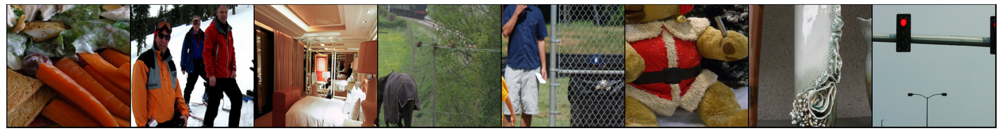

In [ ]:
show_batch(content_dl)

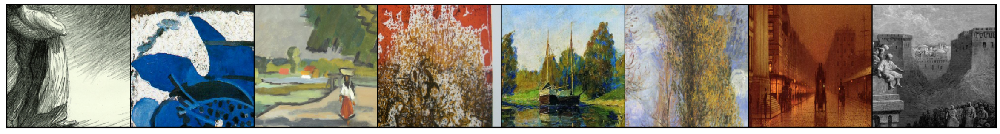

In [ ]:
show_batch(style_dl)

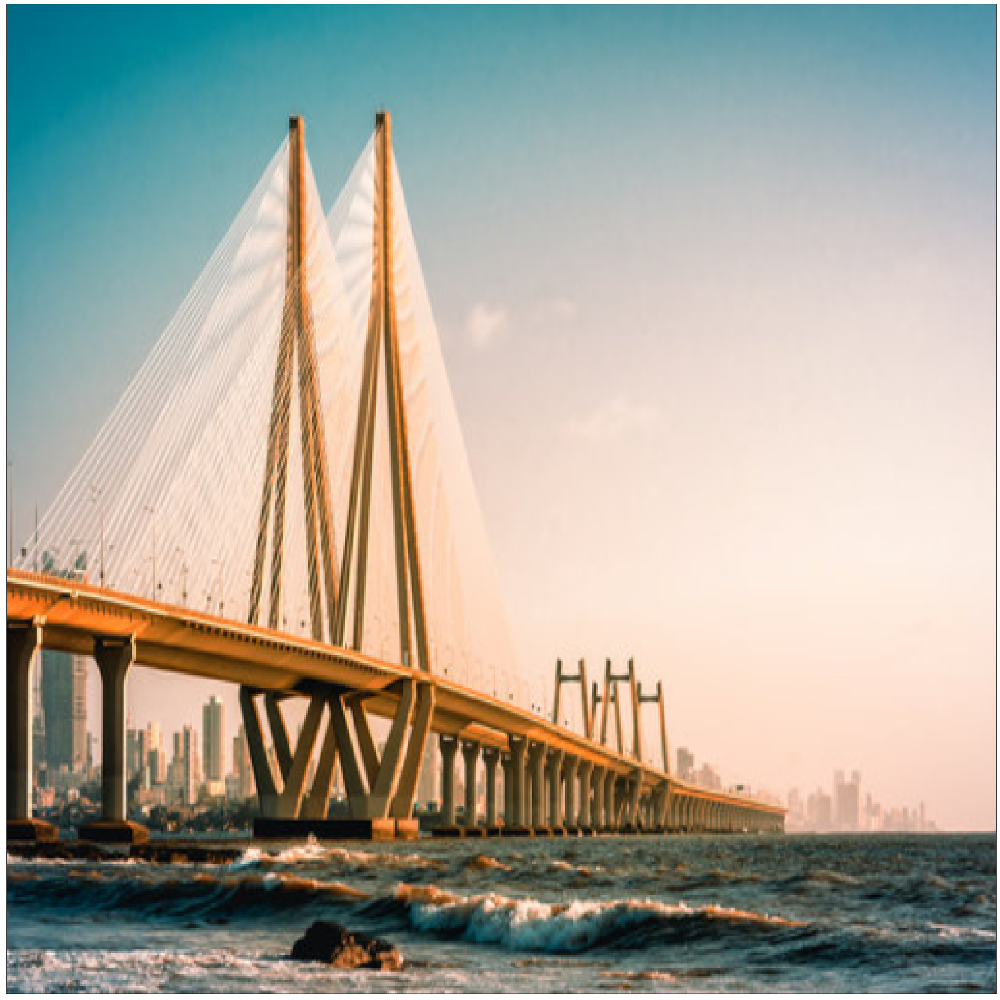

In [ ]:
show_batch(test_content_dl)

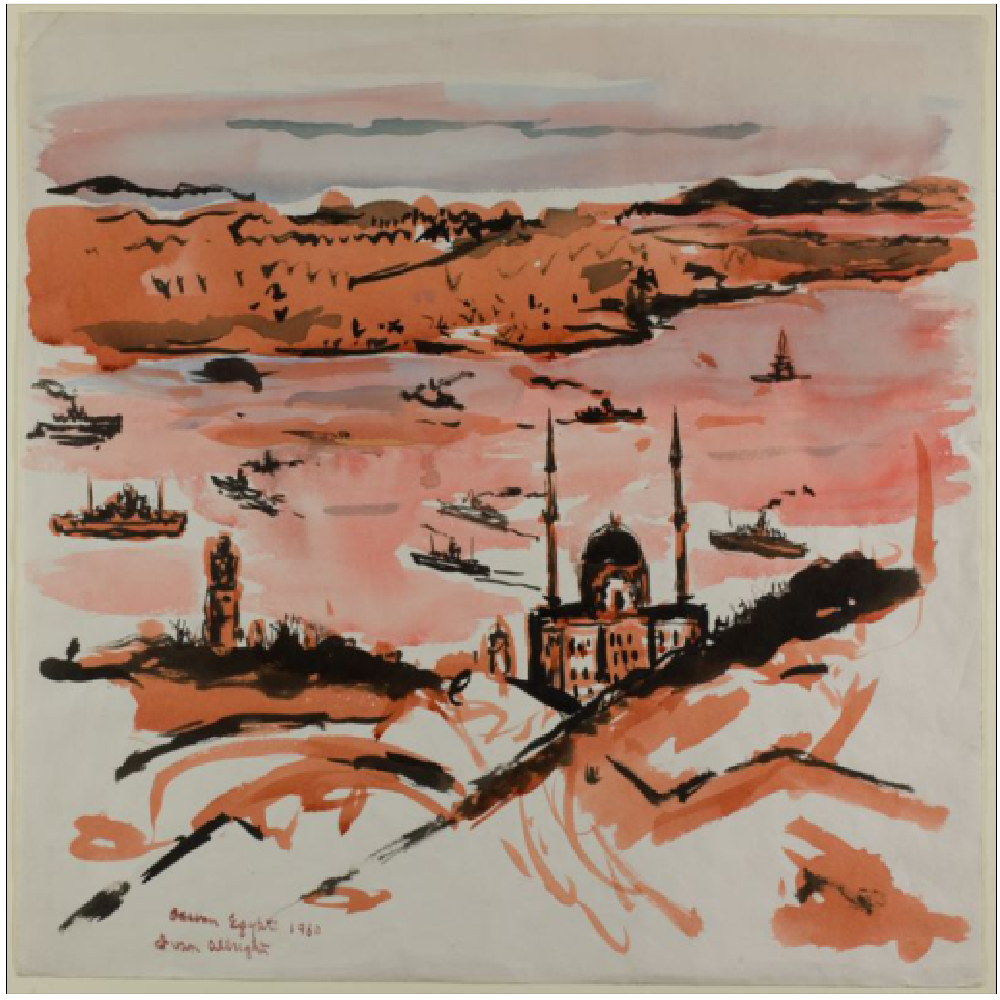

In [ ]:
show_batch(test_style_dl)

###Device and Data Loader Utility Functions for Model Training

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
content_dl = DeviceDataLoader(content_dl, device)
style_dl = DeviceDataLoader(style_dl, device)

test_content_dl = DeviceDataLoader(test_content_dl, device)
test_style_dl = DeviceDataLoader(test_style_dl, device)

# Model

In [ ]:
vg19 = vgg19(True)
print(vg19)

/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

## Encoder

In [ ]:
class VGGEncoder(nn.Module):
    def __init__(self):
        super().__init__()

        # Load the VGG19 model with default weights
        vgg = vgg19(weights='DEFAULT').features

        # Define different slices of the VGG model for feature extraction
        self.slice1 = vgg[:2]
        self.slice2 = vgg[2:7]
        self.slice3 = vgg[7:12]
        self.slice4 = vgg[12:21]

        # Set requires_grad=False for all parameters to freeze the pre-trained weights
        for p in self.parameters():
            p.requires_grad = False

    def forward(self, images, output_last_feature=False):
        """
        Forward pass of the VGGEncoder.

        Args:
            images (Tensor): Input images to be encoded.
            output_last_feature (bool): If True, only the last feature is returned. Otherwise, all intermediate features are returned.

        Returns:
            Tensor or Tuple[Tensor]: Encoded features from the VGG encoder. If output_last_feature is True, returns the last feature tensor. Otherwise, returns a tuple of feature tensors from each slice.
        """
        # Pass the input images through each slice of the VGG encoder
        h1 = self.slice1(images)
        h2 = self.slice2(h1)
        h3 = self.slice3(h2)
        h4 = self.slice4(h3)

        if output_last_feature:
            # Return the last feature tensor
            return h4
        else:
            # Return a tuple of feature tensors from each slice
            return h1, h2, h3, h4


In [ ]:
enc = VGGEncoder()
enc

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /home/ec2-user/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

VGGEncoder(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
  )
  (slice4): Sequential(
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1

In [ ]:
summary(enc, input_size=(batch_size, 3, 512, 512))

Layer (type:depth-idx)                   Output Shape              Param #
VGGEncoder                               [8, 64, 512, 512]         --
├─Sequential: 1-1                        [8, 64, 512, 512]         --
│    └─Conv2d: 2-1                       [8, 64, 512, 512]         (1,792)
│    └─ReLU: 2-2                         [8, 64, 512, 512]         --
├─Sequential: 1-2                        [8, 128, 256, 256]        --
│    └─Conv2d: 2-3                       [8, 64, 512, 512]         (36,928)
│    └─ReLU: 2-4                         [8, 64, 512, 512]         --
│    └─MaxPool2d: 2-5                    [8, 64, 256, 256]         --
│    └─Conv2d: 2-6                       [8, 128, 256, 256]        (73,856)
│    └─ReLU: 2-7                         [8, 128, 256, 256]        --
├─Sequential: 1-3                        [8, 256, 128, 128]        --
│    └─Conv2d: 2-8                       [8, 128, 256, 256]        (147,584)
│    └─ReLU: 2-9                         [8, 128, 256, 256]  

## ADAIN

In [ ]:
def calc_mean_std(features):
    """
    Calculate the mean and standard deviation of the input features.

    Args:
        features (Tensor): Input features of shape [batch_size, c, h, w].

    Returns:
        features_mean (Tensor): Mean of the features of shape [batch_size, c, 1, 1].
        features_std (Tensor): Standard deviation of the features of shape [batch_size, c, 1, 1].
    """

    # Get the batch size and number of channels from the input features
    batch_size, c = features.size()[:2]

    # Calculate the mean and reshape it to match the required shape
    features_mean = features.reshape(batch_size, c, -1).mean(dim=2).reshape(batch_size, c, 1, 1)

    # Calculate the standard deviation and reshape it to match the required shape
    features_std = features.reshape(batch_size, c, -1).std(dim=2).reshape(batch_size, c, 1, 1) + 1e-6

    return features_mean, features_std


def adain(content_features, style_features):
    """
    Apply Adaptive Instance Normalization (AdaIN) to the content features using style features.

    Args:
        content_features (Tensor): Content features of shape [batch_size, c, h, w].
        style_features (Tensor): Style features of shape [batch_size, c, h, w].

    Returns:
        normalized_features (Tensor): Normalized features of shape [batch_size, c, h, w].
    """

    # Calculate the mean and standard deviation of the content and style features
    content_mean, content_std = calc_mean_std(content_features)
    style_mean, style_std = calc_mean_std(style_features)

    # Normalize the content features using the style features
    normalized_features = style_std * (content_features - content_mean) / content_std + style_mean    # Adaptive Instance Normalization

    return normalized_features

## Decoder

In [ ]:
class RC(torch.nn.Module):
    """
    A wrapper of ReflectionPad2d and Conv2d

    This class represents a combination of reflection padding and a convolutional layer.
    It applies reflection padding to the input and then performs convolution on the padded input.
    Optionally, it applies ReLU activation to the output of the convolution.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
        kernel_size (int): Size of the convolution kernel. Default is 3.
        pad_size (int): Size of the reflection padding. Default is 1.
        activated (bool): Whether to apply activation (ReLU) after convolution. Default is True.
    """
    def __init__(self, in_channels, out_channels, kernel_size=3, pad_size=1, activated=True):
        super().__init__()
        self.pad = nn.ReflectionPad2d((pad_size, pad_size, pad_size, pad_size))
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size)
        self.activated = activated

    def forward(self, x):
      """
        Forward pass of the RC module.

        Args:
            x: Input tensor of shape (batch_size, in_channels, height, width).

        Returns:
            Output tensor  after applying reflection padding, convolution,
            and activation (if enabled) of shape (batch_size, out_channels, height, width)
        """
        h = self.pad(x)     # Apply reflection padding to the input tensor
        h = self.conv(h)    # Perform convolution on the padded input
        if self.activated:  # Apply ReLU activation if activated is True
            return F.relu(h)
        else:
            return h         # Otherwise, return the output without activation


class Decoder(nn.Module):
  """
  Decoder network for image reconstruction.
  This network takes features extracted by an encoder network with
  adaptive instance normalization applied using style features and generates a reconstructed image.
  This module consists of a series of RC (ReflectionPad2d and Conv2d) layers for upsampling and Image reconstruction.
  """
    def __init__(self):
        super().__init__()
        self.rc1 = RC(512, 256, 3, 1)
        self.rc2 = RC(256, 256, 3, 1)
        self.rc3 = RC(256, 256, 3, 1)
        self.rc4 = RC(256, 256, 3, 1)
        self.rc5 = RC(256, 128, 3, 1)
        self.rc6 = RC(128, 128, 3, 1)
        self.rc7 = RC(128, 64, 3, 1)
        self.rc8 = RC(64, 64, 3, 1)
        self.rc9 = RC(64, 3, 3, 1, False)

    def forward(self, features):
       """
        Forward pass of the Decoder module.

        Args:
            features (torch.Tensor): Input features from the encoder module.

        Returns:
            torch.Tensor: Output tensor representing the reconstructed image.
        """
        # Forward pass of the Decoder module for image upsampling and reconstruction
        h = self.rc1(features)
        h = F.interpolate(h, scale_factor=2)      # Perform upsampling using F.interpolate with scale factor 2
        h = self.rc2(h)
        h = self.rc3(h)
        h = self.rc4(h)
        h = self.rc5(h)
        h = F.interpolate(h, scale_factor=2)      # Perform another upsampling using F.interpolate with scale factor 2
        h = self.rc6(h)
        h = self.rc7(h)
        h = F.interpolate(h, scale_factor=2)      # Perform another upsampling using F.interpolate with scale factor 2
        h = self.rc8(h)
        h = self.rc9(h)
        return h

In [ ]:
dec = Decoder()
dec

Decoder(
  (rc1): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc2): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc3): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc4): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc5): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc6): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc7): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc8): RC(
    (pad): ReflectionPad2d((1, 1, 1, 1))
    (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  )
  (rc9): RC(
    (

# Computing Loss and Image Generation

In [ ]:
class Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg_encoder = VGGEncoder()  # Initialize the VGGEncoder to extract content and style features
        self.decoder = Decoder()        # Initialize the Decoder for image reconstruction

    def generate(self, content_images, style_images, alpha=1.0):
        """
        Generate a stylized image by  feature maps of the content image
        are normalized using the mean and standard deviation of the corresponding
        style image's feature maps. combining content and style features.
        The normalized feature maps are used to reconstruct the image.

        Args:
            content_images (torch.Tensor): Input content images as tensors.
            style_images (torch.Tensor): Input style images as tensors.
            alpha (float, optional):  Control the level of stylization. Default is 1.0.

        Returns:
            torch.Tensor: Stylized output image.
        """
        content_features = self.vgg_encoder(content_images, output_last_feature=True)  # Extract content features
        style_features = self.vgg_encoder(style_images, output_last_feature=True)      # Extract style features
        t = adain(content_features, style_features)    # Apply Adaptive Instance Normalization (AdaIN) to normalize features
        t = alpha * t + (1 - alpha) * content_features  # Blend content and style features based on alpha
        out = self.decoder(t)                          # Generate the stylized output using the decoder
        return out

    @staticmethod
    def calc_content_loss(out_features, t):
        """
        Calculate the content loss between output features and target features.

        Args:
            out_features (torch.Tensor): Output features generated by the model.
            t (torch.Tensor): Target features (content features).

        Returns:
            torch.Tensor: Content loss value.
        """
        return F.mse_loss(out_features, t)  # Calculate Mean Squared Error (MSE) loss

    @staticmethod
    def calc_style_loss(content_middle_features, style_middle_features):
        """
        Calculate the style loss between content and style features.

        Args:
            content_middle_features (list of torch.Tensor): Content features at different layers.
            style_middle_features (list of torch.Tensor): Style features at different layers.

        Returns:
            torch.Tensor: Style loss value.
        """
        loss = 0
        for c, s in zip(content_middle_features, style_middle_features):
            c_mean, c_std = calc_mean_std(c)   # Calculate mean and standard deviation of content features
            s_mean, s_std = calc_mean_std(s)   # Calculate mean and standard deviation of style features
            loss += F.mse_loss(c_mean, s_mean) + F.mse_loss(c_std, s_std)  # Calculate MSE loss between means and stds
        return loss

    def forward(self, content_images, style_images, alpha=1.0, lam=10):
        """
        Forward pass of the Model.

        Args:
            content_images (torch.Tensor): Input content images as tensors.
            style_images (torch.Tensor): Input style images as tensors.
            alpha (float, optional): Style strength factor. Default is 1.0.
            lam (float, optional): Weight of the style loss. Default is 10.

        Returns:
            torch.Tensor: Total loss value.
        """
        content_features = self.vgg_encoder(content_images, output_last_feature=True)  # Extract features from the content image
        style_features = self.vgg_encoder(style_images, output_last_feature=True)      # Extract features from the style image.
        t = adain(content_features, style_features)    # Apply Adaptive Instance Normalization (AdaIN) to combine features
        t = alpha * t + (1 - alpha) * content_features  # Blend content and style features based on alpha
        out = self.decoder(t)                          # Generate the stylized output using the decoder

        output_features = self.vgg_encoder(out, output_last_feature=True)    # Extract features from the stylized output
        output_middle_features = self.vgg_encoder(out, output_last_feature=False)  # Extract middle-level features from the stylized output
        style_middle_features = self.vgg_encoder(style_images, output_last_feature=False)  # Extract style middle features from the style image

        loss_c = self.calc_content_loss(output_features, t)     # Calculate content loss
        loss_s = self.calc_style_loss(output_middle_features, style_middle_features)  # Calculate style loss from the middle-level features from the stylized output and the style image
        loss = loss_c + lam * loss_s  # Combine content and style loss with the specified lambda weight
        return loss


# Saving Samples

In [ ]:
def denorm(tensor, device):
    """
    Denormalizes the image tensor using the mean and standard deviation values of ImageNet.

    Args:
        tensor (torch.Tensor): The input tensor to be denormalized. It should have shape (C, H, W).
        device (str or torch.device): The device on which the computations should be performed.

    Returns:
        torch.Tensor: The denormalized tensor with values clamped between 0 and 1.
    """
    # Define the standard deviation values for each channel (R, G, B)
    std = torch.Tensor([0.229, 0.224, 0.225]).reshape(-1, 1, 1).to(device)

    # Define the mean values for each channel (R, G, B)
    mean = torch.Tensor([0.485, 0.456, 0.406]).reshape(-1, 1, 1).to(device)

    # Perform denormalization and clamp the tensors between value of 0 and 1 by applying the following formula:
    # Denorm = (Input * STD) + Mean
    denormalized_tensor = torch.clamp(tensor * std + mean, 0, 1)

    return denormalized_tensor

In [ ]:
from torchvision.transforms.functional import resize as rez

new_height, new_width = 512, 512

The above code defines a function called save_sample which is used to generate and save sample images during the training process. The function takes the current epoch and iteration as input parameters and uses them to create a unique file name for each saved image.

Inside the function, the model is used to generate output images from a pair of style and content images in the test dataset. The style, content and output images are first denormalized and all of them are resized to be of the exact same size that is (512,512) for concatenation purpose. The resulting images are then saved as a single image file using the save_image function provided by the torchvision library.

This function is useful for visualizing the progress of the model during training and can help identify any issues with the training process.

In [ ]:
def save_sample(epoch, iter):
    """
    Save stylized samples from the model to disk.

    This function saves stylized samples obtained by applying the trained model
    to a batch of test style and content images. The stylized samples are saved
    in a grid format, including the original content images, style images, and
    the stylized output.

    Args:
        epoch (int): The current epoch number of the training process.
        iter (int): The current iteration number within the epoch.

    Returns:
        None: The function saves the images to disk and does not return any value.

    Example:
        for epoch in range(num_epochs):
            for i, (style, content) in enumerate(zip(test_style_dl, test_content_dl), 1):
                save_sample(epoch, i)
    """
    for (i, (style, content)) in enumerate(zip(test_style_dl, test_content_dl), 1):
        with torch.no_grad():
            # Generate stylized output using the model
            out = model.generate(content[0], style[0])

        # Denormalize the images before saving
        content = denorm(content[0], device)
        style = denorm(style[0], device)
        out = denorm(out, device)

        # Resize the images to a new height and width
        content = rez(content, size=(new_height, new_width))
        style = rez(style, size=(new_height, new_width))
        out = rez(out, size=(new_height, new_width))

        # Concatenate the images into a single grid
        res = torch.cat([content, style, out], dim=0)
        res = res.to('cpu')

        # Save the grid of stylized samples to disk
        torchvision.utils.save_image(res, f'/home/ec2-user/SageMaker/test-images/{epoch}_epoch_{iter}_iteration_{i}_content.png', nrow=batch_size)

# Learning Rate Scheduler

This function adjusts the learning rate of the optimizer based on the number of iterations completed and a specified learning rate decay. The learning rate is decreased as the number of iterations increases, which helps the optimizer converge more effectively as it approaches the optimal solution.

In [ ]:
def adjust_learning_rate(optimiser, iters, learning_rate_decay):
    """
    Adjusts the learning rate of the optimizer during training based on the number of iterations.

    Args:
        optimiser (torch.optim.Optimizer): The optimizer whose learning rate needs to be adjusted.
        iters (int): The current number of iterations in the training process.
        learning_rate_decay (float): The learning rate decay factor, controlling the rate of learning rate reduction.

    Returns:
        None: The function modifies the learning rate in-place within the optimizer.

    Example:
        optimiser = torch.optim.Adam(model.parameters(), lr=0.001)
        for epoch in range(num_epochs):
            for i, (inputs, labels) in enumerate(train_loader):
                # Perform training steps here
                iters = epoch * len(train_loader) + i
                adjust_learning_rate(optimiser, iters, learning_rate_decay=0.001)
    """
    optimiser.param_groups[0]['lr'] = 0.001 / (1.0 + learning_rate_decay * iters)


# Training

The function takes arguments such as the number of epochs to train for, the optimizer to use, and the directory to save the trained model file. It also includes options for changing the number of iterations which is useful when resuming training, learning rate decay, and saving intermediate samples and model checkpoints.

The try block contains the code that may raise an exception, which in this case is caused by a truncated image file, PIL.Image.DecompressionBombError which may occur when reading and loading image files, and a StopIteration exception when there are no more style images in the dataset.

The except block catches the exception and performs an appropriate action. In the case of a truncated image file the error message will be printed, and the current batch of data will be skipped. If a StopIteration error is encountered, the style dataset iterator will be reset to the beginning, and training will continue with the next batch of content data.

The learning rate is decayed over time to improve convergence. The function prints the loss after every 500 iterations and saves the model checkpoint after every 1000 iterations. Finally, the function saves intermediate samples at the end of each epoch.

In [ ]:
def fit(epochs, optimizer=torch.optim.SGD, model_state_dir='/home/ec2-user/SageMaker/trained-models', iters=1,
        epc=1, learning_rate_decay=5e-5):
    """
    Train the model for a specified number of epochs.

    This function performs the training loop for a given number of epochs and updates the model's parameters
    using the provided optimizer. The training progress is printed for each iteration, and the loss is recorded
    in a list. Additionally, the function saves the model state and stylized samples at specific intervals.

    Args:
        epochs (int): The total number of epochs to train the model.
        optimizer (torch.optim.Optimizer, optional): The optimizer to update model parameters. Default is SGD.
        model_state_dir (str, optional): Directory to save the trained model's state. Default is '/home/ec2-user/SageMaker/trained-models'.
        iters (int, optional): The initial value for the number of iterations. Default is 1.
        epc (int, optional): The initial value for the epoch number. Default is 1.
        learning_rate_decay (float, optional): The learning rate decay factor for adjusting the learning rate during training. Default is 5e-5.

    Returns:
        list: List of recorded losses during the training process.

    Example:
        # Assuming you have a defined model, content_dl, and style_dl
        optim = torch.optim.Adam(model.parameters(), lr=0.001)
        loss_list = fit(epochs=20, optimizer=optim)
    """
    # Initialize an empty list to record losses during training
    loss_list = []

    # Get the total number of iterations in the content dataloader
    iterations = len(content_dl)

    # Training loop for each epoch
    for e in range(1, epochs + 1):
        print(f'Start {e} epoch')

        # Create an iterator for the style dataloader
        style_iter = iter(style_dl)
         # start training
        # Iterate over content images in the dataloader
        for (i, content) in tqdm(enumerate(content_dl, 1)):
            try:
                # Fetch a batch of style images from the style dataloader
                style = next(style_iter)

                # Calculate the loss and backpropagate to update model parameters
                loss = model(content[0], style[0])
                loss_list.append(loss.item())
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Decay the Learning rate after each iteration
                adjust_learning_rate(optimizer, iters, learning_rate_decay)

            except (OSError, PIL.Image.DecompressionBombError) as e:
                print(f"Skipping batch due to truncated image file.")
                continue
            except StopIteration as e:
                # Handle the case when the style iterator reaches the end, reset it for the next epoch
                style_iter = iter(style_dl)
                continue

            # Printing the loss for every 500 iterations
            if iters % 500 == 0:
                 print(f'[{epc}/total 20 epoch],[{i} /'
                  f'total {round(iterations)} iteration]: {loss.item()}')

            # Saving the model state every 1000 iterations
            if iters % 1000 == 0:
                torch.save(model.state_dict(), f'{model_state_dir}/{epc}_epoch_{iters}_iterations.pth')

            iters = iters + 1

        # Saving the stylized samples at the end of each epoch
        save_sample(epc, iters)
        epc = epc + 1

    return loss_list

In [ ]:
def modelbase(reuse, learning_rate):
    """
    Create a new model and optimizer or reuse an existing model with a specified learning rate for resuming training.

    This function is used to initialize a new instance of the model and optimizer or load an existing model's state
    using the provided file path. The optimizer is created with the given learning rate.

    Args:
        reuse (str or None): File path to the saved state of an existing model to be reused, or None to create a new model.
        learning_rate (float): The learning rate for the optimizer.

    Returns:
        tuple: A tuple containing the model and optimizer instances.

    Example:
        # Create a new model and optimizer
        model, optimizer = modelbase(reuse=None, learning_rate=0.001)

        # Reuse an existing model and specify a different learning rate
        model, optimizer = modelbase(reuse='/path/to/existing_model.pth', learning_rate=0.0005)
    """
    # Create a new instance of the model and move it to the appropriate device
    model = to_device(Model(), device)

    # If 'reuse' is provided, load the model's state from the specified file path
    if reuse is not None:
        model.load_state_dict(torch.load(reuse))

    # Create the optimizer with the specified learning rate and model parameters
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Return the model and optimizer instances as a tuple
    return model, optimizer

#Training

In [ ]:
model,optimizer = modelbase(reuse=None,learning_rate= 0.001)

In [ ]:
epochs = 20

Please note that the errors in the code cells presented below have been rectified.

### Training 1st part.

In [ ]:
history = fit(epochs,
              optimizer)

Start 1 epoch


132it [02:08,  1.29s/it]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
500it [07:34,  1.78it/s]

[1/total 20 epoch],[500 /total 10348 iteration]: 50.1816520690918


857it [12:49,  1.11it/s]


OSError: Caught OSError in DataLoader worker process 1.
Original Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/worker.py", line 302, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 229, in __getitem__
    sample = self.loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 268, in default_loader
    return pil_loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 248, in pil_loader
    return img.convert("RGB")
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py", line 901, in convert
    self.load()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/ImageFile.py", line 251, in load
    raise OSError(
OSError: image file is truncated (39 bytes not processed)


### Training 2nd part.

In [ ]:
history = fit(epochs,
              optimizer,iters = 857 )

Start 1 epoch


9it [00:07,  1.51it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
38it [00:30,  1.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
500it [06:02,  2.68it/s]

[1/total 20 epoch],[500 /total 10348 iteration]: 38.24506378173828


636it [07:38,  1.32s/it]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
824it [09:35,  1.43it/s]


DecompressionBombError: Caught DecompressionBombError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/worker.py", line 302, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 229, in __getitem__
    sample = self.loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 268, in default_loader
    return pil_loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 247, in pil_loader
    img = Image.open(f)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py", line 3133, in open
    im = _open_core(fp, filename, prefix, formats)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py", line 3120, in _open_core
    _decompression_bomb_check(im.size)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py", line 3029, in _decompression_bomb_check
    raise DecompressionBombError(
PIL.Image.DecompressionBombError: Image size (283327979 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.


### Training 3rd part.

In [ ]:
history = fit(epochs,
              optimizer,iters = 1681)

Start 1 epoch


141it [01:27,  1.62it/s]


NameError: name 'PIL' is not defined

### Training 4th part.

In [ ]:
history = fit(epochs,
              optimizer,iters = 1822)

Start 1 epoch


179it [01:56,  1.29it/s]

[1/total 20 epoch],[179 /total 10348 iteration]: 58.422645568847656


578it [05:48,  3.03it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
679it [06:44,  1.49it/s]

[1/total 20 epoch],[679 /total 10348 iteration]: 40.90179443359375


800it [07:52,  1.69it/s]


Skipping batch 800 due to truncated image file.


StopIteration: 

### Training 5th part.

In [ ]:
history = fit(epochs,
              optimizer,iters = 2622)

Start 1 epoch


6it [00:03,  1.95it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
19it [00:11,  1.79it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self.

[1/total 20 epoch],[379 /total 10348 iteration]: 29.923311233520508


630it [05:31,  1.90it/s]


OSError: Caught OSError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/worker.py", line 302, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 58, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 229, in __getitem__
    sample = self.loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 268, in default_loader
    return pil_loader(path)
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torchvision/datasets/folder.py", line 248, in pil_loader
    return img.convert("RGB")
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py", line 901, in convert
    self.load()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/ImageFile.py", line 251, in load
    raise OSError(
OSError: image file is truncated (4054 bytes not processed)


### Training 6th part.

In [ ]:
history = fit(epochs,
              optimizer,iters = 3251)

Start 1 epoch


127it [00:58,  2.17it/s]


Skipping batch due to truncated image file.
Start 2 epoch


0it [00:00, ?it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File 

[2/total 20 epoch],[123 /total 10348 iteration]: 32.16872024536133


623it [05:07,  1.42it/s]

[2/total 20 epoch],[623 /total 10348 iteration]: 27.780263900756836


643it [05:16,  2.03it/s]


Skipping batch due to truncated image file.
Start 3 epoch


0it [00:00, ?it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f5ea832a820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File 

[3/total 20 epoch],[480 /total 10348 iteration]: 38.217647552490234


744it [05:51,  2.12it/s]


KeyboardInterrupt: 

### Training 7th part.

In [ ]:
history = fit(epochs,
              optimizer,iters=3350)

Start 1 epoch


151it [01:04,  2.81it/s]

[1/total 20 epoch],[151 /total 10348 iteration]: 31.40100860595703


651it [04:25,  1.67it/s]

[1/total 20 epoch],[651 /total 10348 iteration]: 38.259033203125


938it [06:29,  5.24it/s]

Skipping batch due to truncated image file.


967it [06:38,  3.89it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
981it [06:43,  2.88it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    se

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

UnboundLocalError: local variable 'e' referenced before assignment

### Training 8th part.

In [ ]:
history = fit(epochs,
              optimizer,iters=4490)

Start 1 epoch


0it [00:00, ?it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()    
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
self._shutdown_workers()
      File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():if w.is_alive():

  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/

[1/total 20 epoch],[11 /total 10348 iteration]: 25.793472290039062


13it [00:04,  3.39it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
24it [00:09,  2.24it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self

[1/total 20 epoch],[511 /total 10348 iteration]: 29.927940368652344


652it [03:53,  4.59it/s]

Skipping batch due to truncated image file.


697it [04:08,  4.29it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
 

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

UnboundLocalError: local variable 'e' referenced before assignment

### Training 9th part.

In [ ]:
history = fit(epochs,
              optimizer,iters=4500)

Start 1 epoch


1it [00:01,  1.23s/it]

[1/total 20 epoch],[1 /total 10348 iteration]: 39.27293395996094


145it [00:56,  5.75it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
452it [03:15,  4.29it/s]

Skipping batch due to truncated image file.


455it [03:16,  4.02it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
457it [03:17,  3.16it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    se

UnboundLocalError: local variable 'e' referenced before assignment

### Training 10th part.

In [ ]:
history = fit(epochs,
              optimizer,iters=5001)

Start 1 epoch


501it [03:02,  3.38it/s]

[1/total 20 epoch],[500 /total 10348 iteration]: 43.55936813354492


626it [03:45,  3.57it/s]

Skipping batch due to truncated image file.


628it [03:46,  3.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
640it [03:49,  3.24it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[1004 /total 10348 iteration]: 38.16305160522461


1487it [08:33,  4.27it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1489it [08:34,  3.58it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[1/total 20 epoch],[1506 /total 10348 iteration]: 33.55944061279297


2007it [11:21,  5.34it/s]

[1/total 20 epoch],[2006 /total 10348 iteration]: 28.063579559326172


2069it [11:43,  4.59it/s]

Skipping batch due to truncated image file.


2078it [11:46,  4.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2182it [12:17,  5.27it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[1/total 20 epoch],[2508 /total 10348 iteration]: 23.7301025390625


2529it [14:14,  2.83it/s]

Skipping batch due to truncated image file.


2532it [14:15,  3.58it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[1/total 20 epoch],[3010 /total 10348 iteration]: 28.723102569580078


3021it [16:43,  4.99it/s]

Skipping batch due to truncated image file.


3069it [17:02,  2.52it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3081it [17:06,  3.61it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[1/total 20 epoch],[3512 /total 10348 iteration]: 23.530418395996094


3705it [20:52,  4.18it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


3768it [21:25,  5.32it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3774it [21:28,  1.79it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3779it [21:31,  1.89it/s]E

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[4018 /total 10348 iteration]: 25.890460968017578


4519it [24:56,  5.77it/s]

[1/total 20 epoch],[4518 /total 10348 iteration]: 34.91493225097656


5019it [27:26,  3.93it/s]

[1/total 20 epoch],[5018 /total 10348 iteration]: 31.96271514892578


5103it [27:56,  5.14it/s]

Skipping batch due to truncated image file.


5130it [28:03,  3.01it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5135it [28:05,  4.65it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[5522 /total 10348 iteration]: 24.626070022583008


5524it [30:16,  5.12it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5564it [30:36,  3.11it/s]

Skipping batch due to truncated image file.


5572it [30:39,  2.05it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5578it [30:40,  4.41it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[6026 /total 10348 iteration]: 42.718170166015625


6340it [34:08,  2.02it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6526it [35:05,  3.15it/s]

[1/total 20 epoch],[6526 /total 10348 iteration]: 33.31755065917969


6956it [37:15,  2.92it/s]

Skipping batch due to truncated image file.


6989it [37:26,  3.80it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6999it [37:29,  3.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[1/total 20 epoch],[7028 /total 10348 iteration]: 34.857177734375


7336it [38:54,  5.29it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[7530 /total 10348 iteration]: 39.9967155456543


7642it [40:17,  3.57it/s]

Skipping batch due to truncated image file.


7713it [40:39,  4.74it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionErrorcan only test a child process: 
7734it [40:43,  5.66it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[1/total 20 epoch],[8034 /total 10348 iteration]: 51.0185432434082


8253it [43:13,  5.36it/s]

Skipping batch due to truncated image file.


8303it [43:28,  3.86it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8319it [43:32,  3.43it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[1/total 20 epoch],[8536 /total 10348 iteration]: 23.26455307006836


8575it [44:45,  3.12it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>Exception ignored in: 
8577it [44:45,  3.30it/s]
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>Traceback (most recent call last):

Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
        self._shutdown_workers()
self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
        if w.is_alive():if w.is_alive():

  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multipro

[1/total 20 epoch],[9038 /total 10348 iteration]: 35.54291915893555


9380it [48:25,  5.07it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9538it [49:03,  3.13it/s]

[1/total 20 epoch],[9538 /total 10348 iteration]: 56.07296371459961


10038it [51:07,  4.23it/s]

[1/total 20 epoch],[10038 /total 10348 iteration]: 41.73948669433594


10175it [51:44,  6.22it/s]

Skipping batch due to truncated image file.


10216it [51:53,  5.37it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10227it [51:58,  3.01it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f54e9c18820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

RuntimeError: The size of tensor a (8) must match the size of tensor b (7) at non-singleton dimension 0

### Training 11th part.

In [ ]:
model,optimizer = modelbase(reuse='/home/ec2-user/SageMaker/trained-models/1_epoch_15000_iterations.pth',learning_rate= 0.00068)

In [ ]:
epochs =19

history = fit(epochs,
              optimizer,iters=11594,epc=2)

Start 1 epoch


12it [00:02,  5.53it/s]

Skipping batch due to truncated image file.


15it [00:03,  4.89it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
18it [00:04,  3.96it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self

[2/total 19 epoch],[409 /total 10347 iteration]: 24.94406509399414


455it [01:46,  3.60it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
737it [02:55,  3.79it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
910it [03:35,  5.76it/s]

[2/total 19 epoch],[909 /total 10347 iteration]: 34.389129638671875


1048it [04:03,  5.30it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1218it [04:41,  4.30it/s]

Skipping batch due to truncated image file.


1411it [05:26,  4.08it/s]

[2/total 19 epoch],[1411 /total 10347 iteration]: 40.498966217041016


1589it [06:06,  3.50it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1840it [07:01,  3.83it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


1915it [07:18,  3.00it/s]

[2/total 19 epoch],[1915 /total 10347 iteration]: 26.729511260986328


2128it [08:08,  6.21it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2274it [08:36,  5.55it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[2/total 19 epoch],[2415 /total 10347 iteration]: 30.34825897216797


2489it [09:25,  1.90it/s]

Skipping batch due to truncated image file.


2531it [09:47,  2.46it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[2/total 19 epoch],[2917 /total 10347 iteration]: 24.651473999023438


3418it [12:50,  4.51it/s]

[2/total 19 epoch],[3417 /total 10347 iteration]: 26.628307342529297


3917it [14:41,  5.47it/s]

[2/total 19 epoch],[3917 /total 10347 iteration]: 60.85623550415039


3968it [14:53,  3.45it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4091it [15:24,  4.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4233it [15:53,  6.57it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4418it [16:37,  2.99it/s]

[2/total 19 epoch],[4417 /total 10347 iteration]: 30.4383487701416


4918it [18:26,  5.48it/s]

[2/total 19 epoch],[4917 /total 10347 iteration]: 43.811885833740234


5384it [20:05,  5.88it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5418it [20:13,  5.65it/s]

[2/total 19 epoch],[5417 /total 10347 iteration]: 39.0142707824707


5606it [20:53,  2.89it/s]

Skipping batch due to truncated image file.


5880it [21:59,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5900it [22:04,  6.03it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[2/total 19 epoch],[5919 /total 10347 iteration]: 31.69975471496582


6419it [24:02,  4.65it/s]

[2/total 19 epoch],[6419 /total 10347 iteration]: 37.49797058105469


6734it [25:05,  6.55it/s]

Skipping batch due to truncated image file.


6791it [25:26,  6.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[2/total 19 epoch],[6921 /total 10347 iteration]: 31.12212371826172


7408it [27:33,  6.39it/s]

Skipping batch due to truncated image file.


7424it [27:37,  5.22it/s]

[2/total 19 epoch],[7423 /total 10347 iteration]: 60.916412353515625


7914it [29:14,  4.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7924it [29:16,  6.63it/s]

[2/total 19 epoch],[7923 /total 10347 iteration]: 32.114013671875


8031it [29:37,  5.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8424it [31:00,  5.30it/s]

[2/total 19 epoch],[8423 /total 10347 iteration]: 30.455463409423828


8732it [32:05,  5.31it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8924it [32:53,  2.92it/s]

[2/total 19 epoch],[8923 /total 10347 iteration]: 35.82101058959961


9008it [33:09,  6.54it/s]

Skipping batch due to truncated image file.


9041it [33:25,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[2/total 19 epoch],[9425 /total 10347 iteration]: 26.616233825683594


9795it [35:57,  2.89it/s]

Skipping batch due to truncated image file.


9876it [36:15,  3.18it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9927it [36:25,  4.15it/s]

[2/total 19 epoch],[9927 /total 10347 iteration]: 23.990406036376953


10190it [37:20,  5.90it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10232it [37:29,  6.49it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Start 2 epoch


83it [00:18,  4.93it/s]

[3/total 19 epoch],[82 /total 10347 iteration]: 28.916915893554688


583it [02:05,  1.35it/s]

[3/total 19 epoch],[582 /total 10347 iteration]: 32.836212158203125


1082it [03:50,  3.93it/s]

[3/total 19 epoch],[1082 /total 10347 iteration]: 24.295761108398438


1583it [05:41,  6.50it/s]

[3/total 19 epoch],[1582 /total 10347 iteration]: 27.808914184570312


1964it [06:59,  5.02it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1977it [07:03,  3.84it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2083it [07:25,  5.88it/s]

[3/total 19 epoch],[2082 /total 10347 iteration]: 41.13975524902344


2489it [08:50,  6.43it/s]

Skipping batch due to truncated image file.


2537it [09:00,  4.78it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    self._shutdown_workers()
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2585it [09:08,  6.43it/s]

[3/total 19 epoch],[2584 /total 10347 iteration]: 25.818004608154297


2600it [09:11,  4.31it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


2947it [10:36,  3.94it/s]

Skipping batch due to truncated image file.


2951it [10:47,  1.68s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[3/total 19 epoch],[3090 /total 10347 iteration]: 27.191240310668945


3591it [12:52,  6.51it/s]

[3/total 19 epoch],[3590 /total 10347 iteration]: 29.828458786010742


3642it [13:02,  6.09it/s]

Skipping batch due to truncated image file.


3703it [13:15,  6.58it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[3/total 19 epoch],[4094 /total 10347 iteration]: 25.665420532226562


4304it [15:17,  6.11it/s]

Skipping batch due to truncated image file.


4411it [15:40,  6.49it/s]

Skipping batch due to truncated image file.


4414it [15:41,  5.27it/s]<function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user

[3/total 19 epoch],[4598 /total 10347 iteration]: 34.531333923339844


4845it [17:13,  3.79it/s]

Skipping batch due to truncated image file.


5101it [18:02,  4.47it/s]

[3/total 19 epoch],[5100 /total 10347 iteration]: 34.331268310546875


5211it [18:24,  6.09it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5275it [18:37,  6.61it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5510it [19:20,  3.43it/s]Ex

[3/total 19 epoch],[5600 /total 10347 iteration]: 32.73402404785156


5811it [20:25,  4.61it/s]

Skipping batch due to truncated image file.


5820it [20:36,  1.56it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[3/total 19 epoch],[6102 /total 10347 iteration]: 29.546733856201172


6603it [23:24,  5.44it/s]

[3/total 19 epoch],[6602 /total 10347 iteration]: 33.82166290283203


6718it [23:48,  5.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6931it [24:31,  5.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7058it [24:55,  4.69it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7103it [25:05,  5.53it/s]

[3/total 19 epoch],[7102 /total 10347 iteration]: 22.66947364807129


7271it [25:39,  5.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7603it [26:46,  5.35it/s]

[3/total 19 epoch],[7602 /total 10347 iteration]: 29.571557998657227


7785it [27:20,  5.94it/s]

Skipping batch due to truncated image file.


7974it [27:56,  6.50it/s]

Skipping batch due to truncated image file.


7998it [28:10,  5.29it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
self._shutdown_workers()  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    


[3/total 19 epoch],[8106 /total 10347 iteration]: 33.26265335083008


8426it [29:36,  4.67it/s]

Skipping batch due to truncated image file.


8608it [30:20,  4.79it/s]

[3/total 19 epoch],[8608 /total 10347 iteration]: 24.363723754882812


8645it [30:27,  6.45it/s]

Skipping batch due to truncated image file.


8698it [30:47,  5.33it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9010it [31:47,  3.54it/s]

Skipping batch due to truncated image file.


9027it [32:01,  3.04it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9074it [32:12,  3.75it/s]

Skipping batch due to truncated image file.


9117it [32:21,  5.91it/s]

[3/total 19 epoch],[9118 /total 10347 iteration]: 82.50030517578125


9160it [32:49,  5.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9620it [34:24,  5.90it/s]

[3/total 19 epoch],[9620 /total 10347 iteration]: 24.407520294189453


9747it [34:48,  5.70it/s]

Skipping batch due to truncated image file.


9798it [35:09,  4.70it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


10074it [36:04,  5.84it/s]

Skipping batch due to truncated image file.


10119it [36:23,  4.48it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()

[3/total 19 epoch],[10126 /total 10347 iteration]: 28.58749771118164


10128it [36:25,  6.08it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10129it [36:25,  6.12it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
as

Start 3 epoch


280it [00:58,  3.91it/s]

[4/total 19 epoch],[279 /total 10347 iteration]: 24.899436950683594


580it [01:58,  5.35it/s]

Skipping batch due to truncated image file.


628it [02:08,  5.19it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
698it [02:29,  3.29it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
782it [02:45,  5.04it/s]

[4/total 19 epoch],[781 /total 10347 iteration]: 21.875988006591797


794it [02:47,  4.71it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


1077it [03:42,  5.30it/s]

Skipping batch due to truncated image file.


1091it [03:55,  2.99it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
1092it [03:55,  3.50it/s]s()


Skipping batch due to truncated image file.


1269it [04:28,  5.83it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1290it [04:32,  5.75it/s]

[4/total 19 epoch],[1289 /total 10347 iteration]: 23.433656692504883


1790it [06:13,  3.48it/s]

[4/total 19 epoch],[1789 /total 10347 iteration]: 32.674476623535156


1918it [06:38,  5.29it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1994it [06:57,  6.49it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2290it [07:58,  2.46it/s]

[4/total 19 epoch],[2289 /total 10347 iteration]: 25.479656219482422


2598it [08:59,  6.52it/s]

Skipping batch due to truncated image file.


2625it [09:05,  3.39it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2698it [09:18,  5.36it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[4/total 19 epoch],[2793 /total 10347 iteration]: 27.892578125


3190it [10:56,  5.28it/s]

Skipping batch due to truncated image file.


3262it [11:12,  4.80it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3296it [11:18,  6.43it/s]

[4/total 19 epoch],[3295 /total 10347 iteration]: 29.04385757446289


3327it [11:24,  5.69it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


3468it [11:56,  3.88it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3719it [12:46,  6.55it/s]

Skipping batch due to truncated image file.


3780it [13:08,  4.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[4/total 19 epoch],[3801 /total 10347 iteration]: 21.799755096435547


3937it [13:37,  6.31it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4301it [14:46,  5.34it/s]

[4/total 19 epoch],[4301 /total 10347 iteration]: 27.91469383239746


4546it [15:36,  6.19it/s]

Skipping batch due to truncated image file.


4630it [15:52,  6.59it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
4631it [15:52,  6.37it/s]self._parent_pid == os.getpid(), 'can only test a child process'
: can only test a child process
4732it [16:10,  6.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[4/total 19 epoch],[4803 /total 10347 iteration]: 36.040069580078125


5012it [17:00,  4.93it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5299it [18:01,  6.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5303it [18:02,  4.30it/s]

[4/total 19 epoch],[5303 /total 10347 iteration]: 67.13209533691406


5516it [18:43,  6.55it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5617it [19:05,  6.09it/s]

Skipping batch due to truncated image file.


5647it [19:21,  5.21it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[4/total 19 epoch],[5805 /total 10347 iteration]: 29.58989906311035


5907it [20:15,  5.33it/s]

Skipping batch due to truncated image file.


5912it [20:17,  4.72it/s]

Skipping batch due to truncated image file.


5963it [20:47,  6.46it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
5964it [20:47,  6.39it/s]    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


6311it [21:54,  5.28it/s]

[4/total 19 epoch],[6311 /total 10347 iteration]: 25.25168228149414


6714it [23:10,  5.77it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6812it [23:32,  5.61it/s]

[4/total 19 epoch],[6811 /total 10347 iteration]: 42.28998947143555


6825it [23:35,  6.20it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7312it [25:10,  3.81it/s]

[4/total 19 epoch],[7311 /total 10347 iteration]: 17.020431518554688


7644it [26:16,  6.16it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7685it [26:28,  5.17it/s]

Skipping batch due to truncated image file.


7715it [26:45,  2.70it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[4/total 19 epoch],[7813 /total 10347 iteration]: 25.998641967773438


7959it [27:34,  6.31it/s]

Skipping batch due to truncated image file.


7975it [27:39,  2.04it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
7976it [27:39,  2.56it/s]self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7985it [27:41,  6.19it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 

[4/total 19 epoch],[8315 /total 10347 iteration]: 29.134714126586914


8816it [30:29,  5.38it/s]

[4/total 19 epoch],[8815 /total 10347 iteration]: 21.34745979309082


9114it [31:28,  3.40it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[4/total 19 epoch],[9317 /total 10347 iteration]: 24.397823333740234


9818it [33:54,  5.28it/s]

[4/total 19 epoch],[9817 /total 10347 iteration]: 32.898963928222656


10318it [35:34,  3.95it/s]

[4/total 19 epoch],[10317 /total 10347 iteration]: 28.026676177978516


10347it [35:39,  4.84it/s]


Start 4 epoch


183it [00:39,  4.62it/s]

Skipping batch due to truncated image file.


244it [00:50,  6.65it/s]

Skipping batch due to truncated image file.


268it [01:04,  6.14it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
 

[5/total 19 epoch],[474 /total 10347 iteration]: 25.105485916137695


617it [02:14,  4.29it/s]

Skipping batch due to truncated image file.


977it [03:25,  6.71it/s]

[5/total 19 epoch],[976 /total 10347 iteration]: 20.218544006347656


1065it [03:42,  2.37it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1099it [03:51,  4.51it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
1100it [03:51,  4.96it/s]    if w.is_alive():self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
12

[5/total 19 epoch],[1476 /total 10347 iteration]: 25.47185516357422


1634it [05:37,  6.15it/s]

Skipping batch due to truncated image file.


1643it [05:40,  4.83it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
1644it [05:40,  5.21it/s]test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[5/total 19 epoch],[1978 /total 10347 iteration]: 21.771530151367188


2174it [07:27,  5.16it/s]

Skipping batch due to truncated image file.


2253it [07:44,  4.26it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2393it [08:13,  5.38it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2481it [08:34,  5.64it/s]

[5/total 19 epoch],[2480 /total 10347 iteration]: 22.3961238861084


2487it [08:35,  5.21it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2519it [08:41,  4.38it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2981it [10:14,  5.74it/s]

[5/total 19 epoch],[2980 /total 10347 iteration]: 23.485618591308594


3481it [11:51,  6.01it/s]

[5/total 19 epoch],[3480 /total 10347 iteration]: 25.53923797607422


3523it [12:00,  2.99it/s]

Skipping batch due to truncated image file.


3589it [12:13,  5.26it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3729it [12:42,  3.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[5/total 19 epoch],[3982 /total 10347 iteration]: 29.033281326293945


4352it [14:41,  4.70it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[5/total 19 epoch],[4484 /total 10347 iteration]: 18.931081771850586


4540it [15:19,  3.68it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4985it [16:50,  5.26it/s]

[5/total 19 epoch],[4984 /total 10347 iteration]: 19.445934295654297


5485it [18:31,  4.83it/s]

[5/total 19 epoch],[5484 /total 10347 iteration]: 23.769207000732422


5890it [19:55,  4.80it/s]

Skipping batch due to truncated image file.


5987it [20:13,  5.63it/s]

[5/total 19 epoch],[5986 /total 10347 iteration]: 27.33916473388672


6054it [20:28,  4.55it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6230it [21:05,  4.64it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6429it [21:45,  6.57it/s]E

[5/total 19 epoch],[6486 /total 10347 iteration]: 25.5377140045166


6987it [23:33,  6.23it/s]

[5/total 19 epoch],[6986 /total 10347 iteration]: 19.679216384887695


7005it [23:37,  3.49it/s]

Skipping batch due to truncated image file.


7051it [23:45,  3.89it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


7492it [25:14,  5.07it/s]

[5/total 19 epoch],[7492 /total 10347 iteration]: 31.75902557373047


7627it [25:40,  6.55it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7702it [25:56,  5.23it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


7729it [26:11,  1.39s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[5/total 19 epoch],[7994 /total 10347 iteration]: 42.776954650878906


8495it [28:38,  5.52it/s]

[5/total 19 epoch],[8494 /total 10347 iteration]: 13.944784164428711


8653it [29:08,  4.04it/s]

Skipping batch due to truncated image file.


8734it [29:24,  6.54it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


8961it [30:05,  6.50it/s]

Skipping batch due to truncated image file.


9003it [30:13,  6.77it/s]

[5/total 19 epoch],[9002 /total 10347 iteration]: 25.922958374023438


9076it [30:27,  6.59it/s]

Skipping batch due to truncated image file.


9083it [30:48,  1.98s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9084it [30:48,  1.48s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[5/total 19 epoch],[9504 /total 10347 iteration]: 21.61611557006836


9930it [33:43,  4.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10005it [33:59,  5.42it/s]

[5/total 19 epoch],[10004 /total 10347 iteration]: 26.673416137695312


10132it [34:23,  5.42it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10258it [34:50,  5.49it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10344it [35:09,  6.42it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10347it [35:09,  4.90it/s]


Start 5 epoch


32it [00:06,  4.86it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
35it [00:07,  4.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  

Skipping batch due to truncated image file.


162it [00:35,  4.91it/s]

[6/total 19 epoch],[161 /total 10347 iteration]: 36.640594482421875


177it [00:38,  4.92it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
300it [01:01,  3.58it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[6/total 19 epoch],[663 /total 10347 iteration]: 28.265079498291016


710it [02:30,  5.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
783it [02:46,  6.24it/s]

Skipping batch due to truncated image file.


915it [03:16,  5.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1127it [03:56,  5.22it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1130it [03:57,  5.66it/s]Exc

[6/total 19 epoch],[1165 /total 10347 iteration]: 33.348609924316406


1623it [05:36,  6.28it/s]

Skipping batch due to truncated image file.


1626it [05:36,  4.88it/s]ert self._parent_pid == os.getpid(), 'can only test a child process'<function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 

[6/total 19 epoch],[1667 /total 10347 iteration]: 24.59759521484375


2167it [07:25,  5.36it/s]

[6/total 19 epoch],[2167 /total 10347 iteration]: 17.896509170532227


2668it [09:12,  5.91it/s]

[6/total 19 epoch],[2667 /total 10347 iteration]: 23.27056884765625


3167it [10:44,  4.15it/s]

[6/total 19 epoch],[3167 /total 10347 iteration]: 15.627706527709961


3295it [11:10,  6.40it/s]

Skipping batch due to truncated image file.


3486it [11:51,  4.24it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
3487it [11:51,  4.01it/s]    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3550it [12:04,  6.33it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", l

[6/total 19 epoch],[3669 /total 10347 iteration]: 20.128108978271484


3769it [12:45,  5.22it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[6/total 19 epoch],[4171 /total 10347 iteration]: 21.09721565246582


4671it [15:52,  4.43it/s]

[6/total 19 epoch],[4671 /total 10347 iteration]: 37.3629264831543


4881it [16:32,  5.85it/s]

Skipping batch due to truncated image file.


5173it [17:28,  3.78it/s]

[6/total 19 epoch],[5173 /total 10347 iteration]: 23.185209274291992


5201it [17:35,  4.09it/s]

Skipping batch due to truncated image file.


5238it [17:53,  5.37it/s]

Skipping batch due to truncated image file.


5301it [18:07,  6.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5302it [18:07,  6.42it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


5648it [19:15,  5.09it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5682it [19:21,  5.46it/s]

[6/total 19 epoch],[5681 /total 10347 iteration]: 24.384475708007812


5861it [19:59,  3.87it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[6/total 19 epoch],[6183 /total 10347 iteration]: 39.220401763916016


6684it [22:42,  6.73it/s]

[6/total 19 epoch],[6683 /total 10347 iteration]: 33.551185607910156


6793it [23:04,  5.87it/s]

Skipping batch due to truncated image file.


6870it [23:18,  5.84it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
6871it [23:19,  5.99it/s]self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7185it [24:23,  4.16it/s]

[6/total 19 epoch],[7185 /total 10347 iteration]: 24.252050399780273


7264it [24:39,  6.59it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7286it [24:43,  5.92it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7661it [25:55,  6.55it/s]/h

[6/total 19 epoch],[7685 /total 10347 iteration]: 27.57227897644043


7700it [26:07,  6.19it/s]

Skipping batch due to truncated image file.


7755it [26:27,  4.24it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


8038it [27:20,  5.70it/s]

Skipping batch due to truncated image file.


8046it [27:32,  1.56it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[6/total 19 epoch],[8191 /total 10347 iteration]: 19.872737884521484


8268it [28:17,  4.91it/s]

Skipping batch due to truncated image file.


8369it [28:37,  4.75it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[6/total 19 epoch],[8695 /total 10347 iteration]: 15.719581604003906


8995it [30:38,  5.34it/s]

Skipping batch due to truncated image file.


9006it [30:42,  3.94it/s]

Skipping batch due to truncated image file.


9053it [31:01,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
9054it [31:01,  6.44it/s]    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[6/total 19 epoch],[9199 /total 10347 iteration]: 25.206039428710938


9700it [33:05,  4.07it/s]

[6/total 19 epoch],[9699 /total 10347 iteration]: 30.245037078857422


10200it [34:45,  6.12it/s]

[6/total 19 epoch],[10199 /total 10347 iteration]: 19.409517288208008


10347it [35:13,  4.90it/s]


Start 6 epoch


323it [01:00,  4.50it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
can only test a child process
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[7/total 19 epoch],[354 /total 10347 iteration]: 23.15849494934082


621it [01:56,  5.15it/s]

Skipping batch due to truncated image file.


734it [02:17,  6.53it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
857it [02:40,  6.18it/s]

[7/total 19 epoch],[856 /total 10347 iteration]: 37.566688537597656


996it [03:06,  3.53it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1357it [04:18,  6.59it/s]

[7/total 19 epoch],[1356 /total 10347 iteration]: 23.182788848876953


1380it [04:22,  6.58it/s]

Skipping batch due to truncated image file.


1573it [05:01,  6.45it/s]

Skipping batch due to truncated image file.


IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


1730it [05:42,  5.80it/s]

Skipping batch due to truncated image file.


1742it [05:44,  6.42it/s]IOStream.flush timed out
1784it [06:01,  3.69it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", l

[7/total 19 epoch],[1864 /total 10347 iteration]: 22.85040283203125


2220it [07:24,  6.05it/s]

Skipping batch due to truncated image file.


2367it [07:52,  5.51it/s]

[7/total 19 epoch],[2366 /total 10347 iteration]: 25.204702377319336


2370it [07:52,  5.00it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2683it [08:58,  3.33it/s]

Skipping batch due to truncated image file.


2701it [09:11,  3.50it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2702it [09:12,  4.02it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


2870it [09:44,  4.39it/s]

[7/total 19 epoch],[2870 /total 10347 iteration]: 23.357221603393555


3008it [10:13,  5.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3282it [11:06,  4.30it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[7/total 19 epoch],[3370 /total 10347 iteration]: 21.39510726928711


3391it [11:30,  4.59it/s]

Skipping batch due to truncated image file.


3416it [11:45,  5.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


3651it [12:30,  3.66it/s]

Skipping batch due to truncated image file.


3705it [12:51,  6.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[7/total 19 epoch],[3876 /total 10347 iteration]: 36.125343322753906


3906it [13:28,  6.56it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3955it [13:38,  6.57it/s]

Skipping batch due to truncated image file.


4346it [14:54,  5.06it/s]

Skipping batch due to truncated image file.


4353it [15:06,  1.20it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[7/total 19 epoch],[4380 /total 10347 iteration]: 28.754165649414062


4566it [15:47,  5.66it/s]

Skipping batch due to truncated image file.


4675it [16:11,  4.71it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4725it [16:24,  6.07it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4782it [16:34,  6.17it/s]E

[7/total 19 epoch],[4882 /total 10347 iteration]: 28.406673431396484


5164it [17:45,  5.03it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5383it [18:29,  6.60it/s]

[7/total 19 epoch],[5382 /total 10347 iteration]: 31.15873908996582


5883it [20:13,  5.61it/s]

[7/total 19 epoch],[5882 /total 10347 iteration]: 22.123353958129883


5924it [20:22,  6.43it/s]

Skipping batch due to truncated image file.


6116it [21:00,  5.70it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6130it [21:06,  4.70it/s]

Skipping batch due to truncated image file.


6157it [21:31,  6.00it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


6389it [22:19,  4.73it/s]

[7/total 19 epoch],[6388 /total 10347 iteration]: 19.515220642089844


6689it [23:22,  4.63it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6889it [24:00,  4.47it/s]

[7/total 19 epoch],[6888 /total 10347 iteration]: 29.98233413696289


7185it [24:57,  3.11it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7388it [25:38,  3.52it/s]

[7/total 19 epoch],[7388 /total 10347 iteration]: 22.19393539428711


7889it [27:15,  3.60it/s]

[7/total 19 epoch],[7888 /total 10347 iteration]: 29.983776092529297


8217it [28:22,  5.63it/s]

Skipping batch due to truncated image file.


8230it [28:35,  3.97it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[7/total 19 epoch],[8390 /total 10347 iteration]: 24.244037628173828


8891it [30:45,  6.26it/s]

[7/total 19 epoch],[8890 /total 10347 iteration]: 42.70070266723633


9258it [31:55,  6.56it/s]

Skipping batch due to truncated image file.


9393it [32:23,  5.27it/s]

[7/total 19 epoch],[9392 /total 10347 iteration]: 22.01638412475586


9868it [33:54,  6.09it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9892it [34:03,  4.47it/s]

[7/total 19 epoch],[9892 /total 10347 iteration]: 22.126964569091797


9917it [34:08,  3.08it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10224it [35:08,  2.52it/s]

Skipping batch due to truncated image file.


10271it [35:18,  5.61it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10347it [35:33,  4.85it/s]


Start 7 epoch


48it [00:11,  6.66it/s]

[8/total 19 epoch],[47 /total 10347 iteration]: 21.67736053466797


178it [00:37,  3.41it/s]

Skipping batch due to truncated image file.


467it [01:35,  6.30it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
550it [01:53,  5.79it/s]

[8/total 19 epoch],[549 /total 10347 iteration]: 22.16500473022461


612it [02:06,  3.31it/s]

Skipping batch due to truncated image file.


706it [02:24,  5.56it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
753it [02:36,  5.67it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


1056it [03:39,  5.57it/s]

[8/total 19 epoch],[1055 /total 10347 iteration]: 25.290515899658203


1119it [03:52,  3.73it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
1120it [03:52,  4.24it/s]if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1309it [04:30,  3.13it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[8/total 19 epoch],[1557 /total 10347 iteration]: 18.63387680053711


1595it [05:25,  4.76it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2026it [06:52,  6.10it/s]

Skipping batch due to truncated image file.


2059it [06:59,  5.33it/s]

[8/total 19 epoch],[2059 /total 10347 iteration]: 23.746192932128906


2251it [07:38,  3.50it/s]

Skipping batch due to truncated image file.


2265it [07:51,  2.47it/s]

Skipping batch due to truncated image file.


2564it [08:50,  5.97it/s]

[8/total 19 epoch],[2563 /total 10347 iteration]: 31.381750106811523


2578it [08:52,  5.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2609it [08:59,  4.85it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2887it [09:56,  4.26it/s]Ex

[8/total 19 epoch],[3063 /total 10347 iteration]: 34.605560302734375


3564it [12:03,  6.35it/s]

[8/total 19 epoch],[3563 /total 10347 iteration]: 23.032197952270508


4064it [13:37,  5.04it/s]

[8/total 19 epoch],[4063 /total 10347 iteration]: 26.41347312927246


4201it [14:04,  6.42it/s]

Skipping batch due to truncated image file.


4411it [14:44,  6.11it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[8/total 19 epoch],[4565 /total 10347 iteration]: 19.438556671142578


4580it [15:17,  5.48it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()A

[8/total 19 epoch],[5065 /total 10347 iteration]: 18.13996124267578


5566it [18:34,  6.24it/s]

[8/total 19 epoch],[5565 /total 10347 iteration]: 21.53032112121582


5653it [18:50,  5.83it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6066it [20:15,  3.80it/s]

[8/total 19 epoch],[6065 /total 10347 iteration]: 18.596277236938477


6107it [20:22,  5.15it/s]

Skipping batch due to truncated image file.


6137it [20:27,  6.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6293it [21:01,  5.90it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6531it [21:49,  6.03it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[8/total 19 epoch],[6569 /total 10347 iteration]: 19.53343963623047


7015it [23:36,  2.12it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7058it [23:49,  4.93it/s]

Skipping batch due to truncated image file.


7072it [23:52,  6.44it/s]

[8/total 19 epoch],[7071 /total 10347 iteration]: 26.480289459228516


7193it [24:14,  6.52it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7320it [24:38,  4.83it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
7321

[8/total 19 epoch],[7571 /total 10347 iteration]: 19.528820037841797


7614it [25:30,  5.65it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7830it [26:20,  4.14it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7960it [26:47,  5.42it/s]

Skipping batch due to truncated image file.


7997it [27:06,  4.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[8/total 19 epoch],[8073 /total 10347 iteration]: 27.058006286621094


8156it [27:36,  5.02it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8244it [27:55,  5.65it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8246it [27:55,  6.12it/s]

Skipping batch due to truncated image file.


8576it [28:58,  5.88it/s]

[8/total 19 epoch],[8575 /total 10347 iteration]: 27.17111587524414


8659it [29:15,  5.45it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


8887it [30:21,  6.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9080it [31:00,  5.96it/s]

[8/total 19 epoch],[9079 /total 10347 iteration]: 21.706836700439453


9246it [31:34,  4.62it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9580it [32:36,  5.31it/s]

[8/total 19 epoch],[9579 /total 10347 iteration]: 28.738670349121094


9866it [33:31,  6.24it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10080it [34:17,  5.32it/s]

[8/total 19 epoch],[10079 /total 10347 iteration]: 30.787635803222656


10347it [35:08,  4.91it/s]


Start 8 epoch


130it [00:25,  5.62it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
233it [00:49,  5.55it/s]

[9/total 19 epoch],[232 /total 10347 iteration]: 27.51715850830078


240it [00:50,  6.50it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
733it [02:31,  6.69it/s]

[9/total 19 epoch],[732 /total 10347 iteration]: 16.904239654541016


1232it [04:07,  5.37it/s]

[9/total 19 epoch],[1232 /total 10347 iteration]: 22.507266998291016
Skipping batch due to truncated image file.


1255it [04:12,  5.77it/s]

Skipping batch due to truncated image file.


1269it [04:25,  4.00it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


1739it [05:53,  5.82it/s]

[9/total 19 epoch],[1738 /total 10347 iteration]: 28.2413330078125


1820it [06:08,  6.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1891it [06:21,  6.47it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


2034it [06:57,  4.19it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[9/total 19 epoch],[2240 /total 10347 iteration]: 35.349830627441406


2393it [08:11,  6.62it/s]

Skipping batch due to truncated image file.


2466it [08:25,  4.59it/s]

Skipping batch due to truncated image file.


2492it [08:41,  3.84it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[9/total 19 epoch],[2744 /total 10347 iteration]: 23.54236602783203


2970it [10:14,  3.73it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3000it [10:20,  4.86it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3244it [11:08,  5.49it/s]

[9/total 19 epoch],[3244 /total 10347 iteration]: 33.200408935546875


3531it [12:02,  3.62it/s]

Skipping batch due to truncated image file.


3649it [12:26,  3.87it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3666it [12:32,  5.79it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[9/total 19 epoch],[3748 /total 10347 iteration]: 26.40115737915039


3820it [13:01,  6.53it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3944it [13:31,  3.06it/s]

Skipping batch due to truncated image file.


4250it [14:32,  4.76it/s]

[9/total 19 epoch],[4250 /total 10347 iteration]: 27.585580825805664


4563it [15:31,  2.95it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4612it [15:42,  6.19it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4614it [15:43,  3.30it/s]Ex

[9/total 19 epoch],[4750 /total 10347 iteration]: 29.425540924072266


5196it [17:37,  2.89it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5251it [17:50,  5.59it/s]

[9/total 19 epoch],[5250 /total 10347 iteration]: 21.427927017211914


5751it [19:29,  6.48it/s]

[9/total 19 epoch],[5750 /total 10347 iteration]: 21.726383209228516


6251it [21:02,  5.33it/s]

[9/total 19 epoch],[6250 /total 10347 iteration]: 22.375015258789062


6338it [21:19,  5.55it/s]

Skipping batch due to truncated image file.


6730it [22:38,  2.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
6731it [22:39,  2.97it/s]can only test a child process
6753it [22:42,  6.62it/s]

[9/total 19 epoch],[6752 /total 10347 iteration]: 22.493532180786133


6900it [23:12,  5.32it/s]

Skipping batch due to truncated image file.


6934it [23:28,  6.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[9/total 19 epoch],[7254 /total 10347 iteration]: 22.952789306640625


7310it [24:45,  6.14it/s]

Skipping batch due to truncated image file.


7757it [26:11,  5.26it/s]

[9/total 19 epoch],[7756 /total 10347 iteration]: 24.407896041870117


7800it [26:19,  5.82it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[9/total 19 epoch],[8258 /total 10347 iteration]: 23.7236270904541


8759it [29:22,  6.73it/s]

[9/total 19 epoch],[8758 /total 10347 iteration]: 17.7324275970459


9259it [31:04,  6.30it/s]

[9/total 19 epoch],[9258 /total 10347 iteration]: 19.176258087158203


9358it [31:26,  5.98it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9758it [32:44,  5.87it/s]

[9/total 19 epoch],[9758 /total 10347 iteration]: 25.19316291809082


9800it [32:51,  6.37it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9987it [33:32,  3.59it/s]

Skipping batch due to truncated image file.


10083it [33:54,  5.94it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10261it [34:29,  5.74it/s]

[9/total 19 epoch],[10260 /total 10347 iteration]: 29.456165313720703


10347it [34:45,  4.96it/s]


Start 9 epoch


59it [00:12,  5.99it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
352it [01:09,  6.39it/s]

Skipping batch due to truncated image file.


355it [01:09,  4.89it/s]

Skipping batch due to truncated image file.


392it [01:26,  5.26it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
 

[10/total 19 epoch],[417 /total 10347 iteration]: 24.809001922607422


518it [01:57,  6.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
917it [03:17,  3.55it/s]

[10/total 19 epoch],[917 /total 10347 iteration]: 18.827350616455078


1220it [04:13,  6.49it/s]

Skipping batch due to truncated image file.


1229it [04:15,  5.12it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1420it [04:55,  5.78it/s]

[10/total 19 epoch],[1419 /total 10347 iteration]: 18.600481033325195


1497it [05:09,  6.31it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1920it [06:29,  5.71it/s]

[10/total 19 epoch],[1919 /total 10347 iteration]: 33.27170181274414


2050it [06:56,  4.27it/s]

Skipping batch due to truncated image file.


2112it [07:16,  6.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[10/total 19 epoch],[2421 /total 10347 iteration]: 18.772045135498047


2668it [09:00,  4.61it/s]

Skipping batch due to truncated image file.


2734it [09:13,  6.49it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2737it [09:14,  6.54it/s]

Skipping batch due to truncated image file.


2763it [09:29,  5.15it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[10/total 19 epoch],[2925 /total 10347 iteration]: 18.835783004760742


3426it [11:30,  6.65it/s]

[10/total 19 epoch],[3425 /total 10347 iteration]: 15.219488143920898


3463it [11:38,  4.15it/s]

Skipping batch due to truncated image file.


3497it [11:46,  2.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3928it [13:11,  6.27it/s]

[10/total 19 epoch],[3927 /total 10347 iteration]: 19.702762603759766


3948it [13:15,  6.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4428it [14:46,  6.43it/s]

[10/total 19 epoch],[4427 /total 10347 iteration]: 17.544281005859375


4436it [14:47,  4.92it/s]

Skipping batch due to truncated image file.


4480it [15:06,  5.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


4934it [16:44,  5.75it/s]

[10/total 19 epoch],[4933 /total 10347 iteration]: 15.735271453857422


4963it [16:49,  5.93it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[10/total 19 epoch],[5433 /total 10347 iteration]: 28.35657501220703


5934it [19:58,  5.27it/s]

[10/total 19 epoch],[5933 /total 10347 iteration]: 16.566186904907227


6371it [21:20,  5.94it/s]

Skipping batch due to truncated image file.


6402it [21:27,  5.84it/s]

Skipping batch due to truncated image file.


6433it [21:44,  6.07it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[10/total 19 epoch],[6437 /total 10347 iteration]: 23.292194366455078


6440it [21:45,  5.62it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


6935it [23:18,  6.02it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6940it [23:19,  5.55it/s]

[10/total 19 epoch],[6939 /total 10347 iteration]: 18.024812698364258


7283it [24:26,  4.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7440it [24:55,  5.05it/s]

[10/total 19 epoch],[7439 /total 10347 iteration]: 22.217147827148438


7734it [25:52,  2.73it/s]

Skipping batch due to truncated image file.


7749it [26:05,  4.31it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


7840it [26:24,  5.14it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7932it [26:43,  4.82it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[10/total 19 epoch],[7943 /total 10347 iteration]: 28.251251220703125


8097it [27:18,  5.93it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8250it [27:50,  3.66it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8444it [28:29,  5.29it/s]

[10/total 19 epoch],[8443 /total 10347 iteration]: 31.119285583496094


8579it [28:55,  6.56it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[10/total 19 epoch],[8945 /total 10347 iteration]: 31.77933120727539


9008it [30:19,  6.01it/s]

Skipping batch due to truncated image file.


9079it [30:34,  6.20it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
9080it [30:34,  6.23it/s]    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9298it [31:19,  6.29it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", l

[10/total 19 epoch],[9447 /total 10347 iteration]: 19.50922393798828


9948it [33:29,  5.40it/s]

[10/total 19 epoch],[9947 /total 10347 iteration]: 19.87176513671875


10037it [33:44,  6.45it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10347it [34:50,  4.95it/s]
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <f

Start 10 epoch


101it [00:21,  6.19it/s]

[11/total 19 epoch],[100 /total 10347 iteration]: 19.582908630371094


601it [01:57,  5.20it/s]

[11/total 19 epoch],[600 /total 10347 iteration]: 15.820592880249023


972it [03:09,  6.32it/s]

Skipping batch due to truncated image file.


1103it [03:35,  6.77it/s]

[11/total 19 epoch],[1102 /total 10347 iteration]: 38.327598571777344


1150it [03:45,  5.17it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1393it [04:32,  5.53it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


1605it [05:26,  5.11it/s]

[11/total 19 epoch],[1606 /total 10347 iteration]: 17.61647605895996


1742it [06:03,  4.27it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1776it [06:09,  5.54it/s]

Skipping batch due to truncated image file.


2109it [07:11,  6.53it/s]

[11/total 19 epoch],[2108 /total 10347 iteration]: 18.4540958404541


2117it [07:12,  6.59it/s]

Skipping batch due to truncated image file.


2142it [07:27,  6.33it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[11/total 19 epoch],[2610 /total 10347 iteration]: 24.657772064208984


2838it [09:39,  5.14it/s]

Skipping batch due to truncated image file.


2859it [09:44,  5.32it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f1f8661d820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2898it [09:51,  4.90it/s]


KeyboardInterrupt: 

## Model training last part

In [ ]:
model,optimizer = modelbase(reuse='/home/ec2-user/SageMaker/trained-models/11_epoch_107000_iterations.pth',
                            learning_rate= 0.0002)

epochs = 10
history = fit(epochs,
              optimizer,iters=107001,epc=11)

Start 1 epoch


56it [01:01,  1.40s/it]

Skipping batch due to truncated image file.


73it [01:13,  1.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
224it [03:29,  1.41it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    sel

[11/total 20 epoch],[502 /total 10347 iteration]: 20.314773559570312


598it [08:57,  1.24it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
904it [13:23,  1.22it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
938it [13:53,  1.30it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1002it [14:58,  2.04it/s]

[11/total 20 epoch],[1002 /total 10347 iteration]: 18.323104858398438


1502it [21:58,  1.37it/s]

[11/total 20 epoch],[1502 /total 10347 iteration]: 36.805442810058594


1914it [27:03,  1.36it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2002it [28:14,  1.70it/s]

[11/total 20 epoch],[2002 /total 10347 iteration]: 17.342205047607422


2502it [34:01,  1.95it/s]

[11/total 20 epoch],[2502 /total 10347 iteration]: 23.34484100341797


2640it [35:34,  3.30it/s]

Skipping batch due to truncated image file.


2716it [36:15,  1.91it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2765it [36:54,  2.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2891it [37:58,  2.24it/s]E

[11/total 20 epoch],[3004 /total 10347 iteration]: 18.608333587646484


3113it [39:56,  2.04it/s]

Skipping batch due to truncated image file.


IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


3508it [43:20,  2.52it/s]

[11/total 20 epoch],[3508 /total 10347 iteration]: 23.815876007080078


3552it [43:43,  2.61it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3819it [45:45,  4.28it/s]

Skipping batch due to truncated image file.


3828it [45:50,  2.10it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


4012it [47:08,  2.07it/s]

[11/total 20 epoch],[4012 /total 10347 iteration]: 18.547588348388672


4113it [48:04,  1.62it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4118it [48:07,  2.37it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[11/total 20 epoch],[4512 /total 10347 iteration]: 23.25898551940918


5013it [55:04,  2.26it/s]

[11/total 20 epoch],[5012 /total 10347 iteration]: 20.933992385864258


5138it [55:57,  3.87it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5513it [58:51,  3.94it/s]

[11/total 20 epoch],[5512 /total 10347 iteration]: 31.930818557739258


5668it [59:52,  3.03it/s]

Skipping batch due to truncated image file.


5766it [1:00:42,  4.23it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
5767it [1:00:42,  4.76it/s]: can only test a child process
5929it [1:01:40,  2.99it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466

[11/total 20 epoch],[6014 /total 10347 iteration]: 16.04071044921875


6267it [1:03:58,  2.27it/s]

Skipping batch due to truncated image file.


6352it [1:04:25,  4.47it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[11/total 20 epoch],[6518 /total 10347 iteration]: 20.657188415527344


7018it [1:08:19,  4.27it/s]

[11/total 20 epoch],[7018 /total 10347 iteration]: 18.42658233642578


7323it [1:10:11,  3.19it/s]

Skipping batch due to truncated image file.


7502it [1:11:13,  3.07it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7512it [1:11:22,  1.17it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
7513it [1:11:22,  1.55it/s]  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child pro

[11/total 20 epoch],[7520 /total 10347 iteration]: 24.830074310302734


7810it [1:13:21,  2.47it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):

  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
        self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    self._shutdown_workers()if w.is_alive():

  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    

[11/total 20 epoch],[8022 /total 10347 iteration]: 15.786887168884277


8176it [1:15:23,  1.59it/s]

Skipping batch due to truncated image file.


8357it [1:16:21,  2.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8363it [1:16:22,  4.76it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__


[11/total 20 epoch],[8524 /total 10347 iteration]: 17.605825424194336


8546it [1:17:28,  3.01it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


8903it [1:19:41,  1.83it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9009it [1:20:20,  2.96it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__


[11/total 20 epoch],[9028 /total 10347 iteration]: 27.877994537353516


9529it [1:22:57,  6.59it/s]

[11/total 20 epoch],[9528 /total 10347 iteration]: 20.41667366027832


10029it [1:25:45,  3.60it/s]

[11/total 20 epoch],[10028 /total 10347 iteration]: 25.402250289916992


10347it [1:27:37,  1.97it/s]


Start 2 epoch


48it [00:11,  6.12it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
181it [00:51,  4.27it/s]

[12/total 20 epoch],[181 /total 10347 iteration]: 19.5460205078125


681it [03:05,  3.77it/s]

[12/total 20 epoch],[681 /total 10347 iteration]: 19.141883850097656


1181it [05:21,  2.01it/s]

[12/total 20 epoch],[1181 /total 10347 iteration]: 19.82935905456543


1373it [06:20,  3.92it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1681it [07:55,  5.38it/s]

[12/total 20 epoch],[1681 /total 10347 iteration]: 14.734750747680664


2007it [09:30,  4.87it/s]

Skipping batch due to truncated image file.


2131it [10:18,  1.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2183it [10:41,  1.78s/it]

[12/total 20 epoch],[2183 /total 10347 iteration]: 18.040283203125


2207it [10:48,  4.83it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[12/total 20 epoch],[2685 /total 10347 iteration]: 22.402812957763672


3044it [14:34,  5.43it/s]

Skipping batch due to truncated image file.


3187it [15:09,  2.20it/s]

[12/total 20 epoch],[3187 /total 10347 iteration]: 21.125080108642578


3389it [15:58,  5.15it/s]

Skipping batch due to truncated image file.


3399it [16:10,  1.90it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[12/total 20 epoch],[3689 /total 10347 iteration]: 19.976058959960938


4189it [19:32,  5.99it/s]

[12/total 20 epoch],[4189 /total 10347 iteration]: 21.32376480102539


4211it [19:37,  3.73it/s]

Skipping batch due to truncated image file.


4452it [20:33,  5.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4482it [20:41,  5.08it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[12/total 20 epoch],[4691 /total 10347 iteration]: 19.0526180267334


5103it [23:22,  3.04it/s]

Skipping batch due to truncated image file.


5193it [23:46,  2.54it/s]

[12/total 20 epoch],[5193 /total 10347 iteration]: 20.508529663085938


5262it [24:02,  6.01it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5290it [24:11,  3.37it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[12/total 20 epoch],[5695 /total 10347 iteration]: 24.371366500854492


6024it [27:01,  5.51it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6149it [27:30,  4.20it/s]

Skipping batch due to truncated image file.


6197it [27:40,  5.62it/s]

[12/total 20 epoch],[6197 /total 10347 iteration]: 25.136302947998047


6289it [27:58,  4.08it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6697it [29:45,  5.24it/s]

[12/total 20 epoch],[6697 /total 10347 iteration]: 18.95180892944336


6807it [30:12,  6.61it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7053it [31:11,  6.53it/s]

Skipping batch due to truncated image file.


7200it [31:50,  3.61it/s]

[12/total 20 epoch],[7199 /total 10347 iteration]: 15.758941650390625


7202it [31:50,  4.41it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7575it [33:13,  2.05it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7699it [33:44,  2.65it/s]

[12/total 20 epoch],[7699 /total 10347 iteration]: 12.231252670288086


7841it [34:17,  5.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7884it [34:28,  3.70it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8200it [35:42,  2.22it/s]

[12/total 20 epoch],[8199 /total 10347 iteration]: 16.666240692138672


8700it [37:36,  4.88it/s]

[12/total 20 epoch],[8699 /total 10347 iteration]: 23.471521377563477


9199it [39:38,  3.72it/s]

[12/total 20 epoch],[9199 /total 10347 iteration]: 21.459270477294922


9497it [40:42,  6.46it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9627it [41:13,  6.30it/s]

Skipping batch due to truncated image file.


9702it [41:29,  4.40it/s]

[12/total 20 epoch],[9701 /total 10347 iteration]: 24.643278121948242


10037it [42:56,  3.71it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10107it [43:11,  4.39it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
  

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[12/total 20 epoch],[10203 /total 10347 iteration]: 20.40420150756836


10347it [44:06,  3.91it/s]


Start 3 epoch


164it [00:36,  6.45it/s]

Skipping batch due to truncated image file.


220it [00:51,  2.46it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
272it [01:04,  5.81it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
358it [01:23,  2.19it/s]

[13/total 20 epoch],[358 /total 10347 iteration]: 15.582670211791992


601it [02:16,  4.81it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
842it [03:09,  4.60it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
859it [03:13,  5.78it/s]

[13/total 20 epoch],[858 /total 10347 iteration]: 23.029094696044922


1358it [05:00,  3.69it/s]

[13/total 20 epoch],[1358 /total 10347 iteration]: 34.30046081542969


1858it [06:44,  4.52it/s]

[13/total 20 epoch],[1858 /total 10347 iteration]: 25.470754623413086


1934it [06:59,  3.55it/s]

Skipping batch due to truncated image file.


2135it [07:43,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2304it [08:22,  5.50it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[13/total 20 epoch],[2360 /total 10347 iteration]: 22.403244018554688


2447it [08:53,  5.18it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2860it [10:24,  4.11it/s]

[13/total 20 epoch],[2860 /total 10347 iteration]: 21.13747215270996


3067it [11:10,  6.30it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3268it [11:52,  5.62it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3361it [12:15,  6.44it/s]

[13/total 20 epoch],[3360 /total 10347 iteration]: 20.319232940673828


3502it [12:42,  5.86it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3603it [13:02,  4.26it/s]

Skipping batch due to truncated image file.


3706it [13:25,  6.64it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3741it [13:36,  5.12it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3863it [14:02,  6.21it/s]

[13/total 20 epoch],[3862 /total 10347 iteration]: 15.098722457885742


4030it [14:39,  5.91it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    
assert self._parent_pid == os.getpid(), 'can only test a child process'
4362it [15:44,  4.70it/s]test a child process

[13/total 20 epoch],[4362 /total 10347 iteration]: 17.355758666992188


4489it [16:09,  6.65it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


4635it [16:40,  4.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
      File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4867it [17:25,  5.71it/s]

[13/total 20 epoch],[4866 /total 10347 iteration]: 12.928699493408203


5121it [18:19,  5.90it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5367it [19:10,  2.54it/s]

[13/total 20 epoch],[5366 /total 10347 iteration]: 24.423965454101562


5752it [20:28,  4.58it/s]

Skipping batch due to truncated image file.


5782it [20:45,  5.70it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
5783it [20:45,  5.82it/s]test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[13/total 20 epoch],[5868 /total 10347 iteration]: 20.886533737182617


6210it [22:12,  6.49it/s]

Skipping batch due to truncated image file.


6371it [22:48,  6.43it/s]

[13/total 20 epoch],[6370 /total 10347 iteration]: 16.48030662536621


6421it [22:59,  2.34it/s]

Skipping batch due to truncated image file.


6468it [23:17,  6.64it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[13/total 20 epoch],[6872 /total 10347 iteration]: 15.488106727600098


7373it [26:19,  6.12it/s]

[13/total 20 epoch],[7372 /total 10347 iteration]: 23.932537078857422


7599it [27:02,  4.77it/s]

Skipping batch due to truncated image file.


7640it [27:13,  5.41it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
7641it [27:13,  5.63it/s]id == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7675it [27:21,  4.85it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[13/total 20 epoch],[7874 /total 10347 iteration]: 20.43905258178711


8211it [29:11,  3.78it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8374it [29:47,  4.03it/s]

[13/total 20 epoch],[8374 /total 10347 iteration]: 20.34355354309082


8874it [31:22,  5.33it/s]

[13/total 20 epoch],[8874 /total 10347 iteration]: 17.30202865600586


9167it [32:20,  4.21it/s]

Skipping batch due to truncated image file.


9264it [32:39,  5.48it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9376it [33:07,  5.15it/s]

[13/total 20 epoch],[9376 /total 10347 iteration]: 26.679962158203125


9533it [33:41,  5.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9767it [34:29,  6.33it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9877it [34:55,  2.54it/s]

[13/total 20 epoch],[9876 /total 10347 iteration]: 17.36362075805664


9888it [34:57,  5.39it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10347it [36:32,  4.72it/s]


Start 4 epoch


29it [00:06,  3.57it/s]

[14/total 20 epoch],[29 /total 10347 iteration]: 17.701093673706055


529it [01:49,  6.01it/s]

[14/total 20 epoch],[529 /total 10347 iteration]: 13.392627716064453


709it [02:27,  4.32it/s]

Skipping batch due to truncated image file.


1019it [03:30,  5.51it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[14/total 20 epoch],[1033 /total 10347 iteration]: 17.17247200012207
Skipping batch due to truncated image file.


1050it [03:37,  3.21it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

Skipping batch due to truncated image file.


1540it [05:15,  5.87it/s]

[14/total 20 epoch],[1539 /total 10347 iteration]: 16.050922393798828


1986it [06:40,  4.77it/s]

Skipping batch due to truncated image file.


2014it [06:58,  5.77it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[14/total 20 epoch],[2041 /total 10347 iteration]: 20.029266357421875


2253it [07:46,  6.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2542it [08:46,  5.74it/s]

[14/total 20 epoch],[2541 /total 10347 iteration]: 16.908336639404297


2583it [08:55,  3.30it/s]

Skipping batch due to truncated image file.


2650it [09:08,  4.78it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2844it [09:47,  6.04it/s]

Skipping batch due to truncated image file.


2870it [10:03,  3.62it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[14/total 20 epoch],[3045 /total 10347 iteration]: 14.443522453308105


3546it [12:16,  5.64it/s]

[14/total 20 epoch],[3545 /total 10347 iteration]: 18.318065643310547


4045it [13:55,  2.23it/s]

[14/total 20 epoch],[4045 /total 10347 iteration]: 29.59893798828125


4546it [15:31,  6.82it/s]

[14/total 20 epoch],[4545 /total 10347 iteration]: 21.440692901611328


4803it [16:28,  4.18it/s]

Skipping batch due to truncated image file.


4863it [16:40,  6.66it/s]

Skipping batch due to truncated image file.


4874it [16:43,  4.37it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[14/total 20 epoch],[5049 /total 10347 iteration]: 17.074905395507812


5153it [17:36,  6.36it/s]

Skipping batch due to truncated image file.


5160it [17:37,  5.55it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5253it [17:59,  3.27it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5452it [18:39,  5.15it/s]E

[14/total 20 epoch],[5551 /total 10347 iteration]: 21.34195899963379


5771it [19:47,  2.06it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[14/total 20 epoch],[6053 /total 10347 iteration]: 19.828413009643555


6211it [21:29,  5.92it/s]

Skipping batch due to truncated image file.


6386it [22:05,  6.56it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
6387it [22:06,  6.53it/s]  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive

    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6426it [22:13,  6.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", l

Skipping batch due to truncated image file.


6442it [22:26,  2.01it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[14/total 20 epoch],[6557 /total 10347 iteration]: 22.929779052734375


7058it [24:25,  6.41it/s]

[14/total 20 epoch],[7057 /total 10347 iteration]: 20.094892501831055


7117it [24:38,  3.61it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7210it [24:58,  6.66it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7305it [25:17,  3.98it/s]

Skipping batch due to truncated image file.


7559it [26:07,  6.01it/s]

[14/total 20 epoch],[7559 /total 10347 iteration]: 14.52640438079834


7787it [26:52,  3.44it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7794it [26:54,  4.25it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7904it [27:16,  4.22it/s]Ex

[14/total 20 epoch],[8059 /total 10347 iteration]: 33.7821044921875


8445it [28:58,  2.92it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8514it [29:14,  4.38it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8559it [29:24,  4.46it/s]

[14/total 20 epoch],[8559 /total 10347 iteration]: 19.526248931884766


8917it [30:31,  5.35it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__

Traceback (most recent call last):
      File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
self._shutdown_workers()    
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
self._shutdown_workers()    
if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
      File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive


[14/total 20 epoch],[9061 /total 10347 iteration]: 13.861298561096191


9383it [32:14,  5.14it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9562it [32:56,  4.27it/s]

[14/total 20 epoch],[9561 /total 10347 iteration]: 23.313274383544922


9773it [33:37,  6.34it/s]

Skipping batch due to truncated image file.


9983it [34:17,  6.63it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[14/total 20 epoch],[10065 /total 10347 iteration]: 20.498130798339844


10347it [35:27,  4.86it/s]


Start 5 epoch


182it [00:37,  3.93it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
218it [00:47,  5.92it/s]

[15/total 20 epoch],[218 /total 10347 iteration]: 18.42288589477539


506it [01:38,  6.16it/s]

Skipping batch due to truncated image file.


622it [01:58,  5.08it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
721it [02:18,  5.68it/s]

[15/total 20 epoch],[720 /total 10347 iteration]: 15.470466613769531


892it [02:54,  5.62it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
914it [03:02,  4.93it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1220it [04:02,  4.87it/s]

[15/total 20 epoch],[1220 /total 10347 iteration]: 17.052913665771484


1685it [05:31,  4.89it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1720it [05:41,  5.31it/s]

[15/total 20 epoch],[1720 /total 10347 iteration]: 21.006927490234375


2220it [07:22,  5.17it/s]

[15/total 20 epoch],[2220 /total 10347 iteration]: 24.24381446838379


2720it [08:57,  2.77it/s]

[15/total 20 epoch],[2720 /total 10347 iteration]: 32.140419006347656


3077it [10:04,  4.58it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3220it [10:34,  4.62it/s]

[15/total 20 epoch],[3220 /total 10347 iteration]: 13.224959373474121


3570it [11:41,  6.31it/s]

Skipping batch due to truncated image file.


3582it [11:45,  4.53it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
3722it [12:12,  4.66it/s]

[15/total 20 epoch],[3722 /total 10347 iteration]: 33.58393859863281


4223it [13:47,  3.36it/s]

[15/total 20 epoch],[4222 /total 10347 iteration]: 12.215877532958984


4240it [13:50,  5.22it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
4241it [13:50,  5.54it/s]self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4276it [13:56,  6.28it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4722it

[15/total 20 epoch],[4722 /total 10347 iteration]: 15.199918746948242


5223it [17:05,  6.68it/s]

[15/total 20 epoch],[5222 /total 10347 iteration]: 25.108203887939453


5258it [17:12,  5.60it/s]

Skipping batch due to truncated image file.


5287it [17:27,  4.80it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[15/total 20 epoch],[5724 /total 10347 iteration]: 20.499618530273438


5732it [18:52,  6.54it/s]

Skipping batch due to truncated image file.


5752it [18:55,  6.31it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5816it [19:09,  5.39it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6013it [19:51,  5.86it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
6014it [19:51,  6.02it/s]Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers

Skipping batch due to truncated image file.


6193it [20:34,  3.09it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[15/total 20 epoch],[6228 /total 10347 iteration]: 18.62460708618164


6729it [22:21,  6.24it/s]

[15/total 20 epoch],[6728 /total 10347 iteration]: 26.47574234008789


6843it [22:43,  6.72it/s]

Skipping batch due to truncated image file.


6961it [23:05,  6.65it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[15/total 20 epoch],[7232 /total 10347 iteration]: 19.58028793334961


7732it [25:30,  5.54it/s]

[15/total 20 epoch],[7732 /total 10347 iteration]: 20.747962951660156


7798it [25:43,  5.49it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8233it [27:13,  6.39it/s]

[15/total 20 epoch],[8232 /total 10347 iteration]: 29.108779907226562


8733it [28:47,  6.26it/s]

[15/total 20 epoch],[8732 /total 10347 iteration]: 26.921518325805664


8850it [29:09,  4.23it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8869it [29:16,  5.80it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9232it [30:28,  5.20it/s]

[15/total 20 epoch],[9232 /total 10347 iteration]: 19.008338928222656


9568it [31:35,  5.50it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9733it [32:13,  3.35it/s]

[15/total 20 epoch],[9732 /total 10347 iteration]: 17.438495635986328


9977it [33:00,  4.65it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10116it [33:26,  4.51it/s]

Skipping batch due to truncated image file.


10235it [33:49,  5.98it/s]

[15/total 20 epoch],[10234 /total 10347 iteration]: 21.957759857177734


10347it [34:11,  5.04it/s]


Start 6 epoch


214it [00:40,  6.41it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    
if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
Traceback (most recent call last):
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__

    self._shutdown_workers()
  File "/home/ec2-user/an

[16/total 20 epoch],[389 /total 10347 iteration]: 18.727933883666992


421it [01:18,  6.14it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
802it [02:37,  5.27it/s]

Skipping batch due to truncated image file.


891it [02:54,  5.90it/s]

[16/total 20 epoch],[891 /total 10347 iteration]: 31.998355865478516


1184it [03:53,  6.70it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1270it [04:11,  5.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1307it [04:19,  6.69it/s]Ex

[16/total 20 epoch],[1391 /total 10347 iteration]: 14.994058609008789


1891it [06:04,  5.24it/s]

[16/total 20 epoch],[1891 /total 10347 iteration]: 15.850263595581055


2191it [07:04,  5.36it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[16/total 20 epoch],[2393 /total 10347 iteration]: 20.503437042236328


2847it [09:07,  4.35it/s]

Skipping batch due to truncated image file.


2849it [09:08,  3.97it/s]

Skipping batch due to truncated image file.


2882it [09:25,  5.58it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[16/total 20 epoch],[2897 /total 10347 iteration]: 19.940689086914062


2903it [09:29,  4.35it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


3221it [10:31,  6.28it/s]

Skipping batch due to truncated image file.


3257it [10:48,  4.90it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[16/total 20 epoch],[3401 /total 10347 iteration]: 24.87261199951172


3901it [12:50,  5.99it/s]

[16/total 20 epoch],[3901 /total 10347 iteration]: 21.61432456970215


4402it [14:25,  4.78it/s]

[16/total 20 epoch],[4401 /total 10347 iteration]: 24.28706169128418


4738it [15:31,  6.08it/s]

Skipping batch due to truncated image file.


4904it [16:00,  6.26it/s]

[16/total 20 epoch],[4903 /total 10347 iteration]: 20.868146896362305


4958it [16:10,  6.68it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[16/total 20 epoch],[5405 /total 10347 iteration]: 21.38903045654297


5905it [19:14,  4.85it/s]

[16/total 20 epoch],[5905 /total 10347 iteration]: 15.444543838500977


6092it [19:50,  5.83it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6214it [20:13,  6.46it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6342it [20:43,  4.51it/s]

Skipping batch due to truncated image file.


6407it [20:55,  4.30it/s]

[16/total 20 epoch],[6407 /total 10347 iteration]: 24.74492073059082


6416it [20:56,  6.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6678it [21:46,  6.70it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[16/total 20 epoch],[6907 /total 10347 iteration]: 20.775501251220703


7094it [23:06,  4.17it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7407it [24:06,  4.90it/s]

[16/total 20 epoch],[7407 /total 10347 iteration]: 24.341690063476562


7907it [25:41,  5.95it/s]

[16/total 20 epoch],[7907 /total 10347 iteration]: 19.258655548095703


7964it [25:53,  6.63it/s]

Skipping batch due to truncated image file.


8117it [26:24,  5.87it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[16/total 20 epoch],[8411 /total 10347 iteration]: 18.67137336730957


8912it [28:55,  6.82it/s]

[16/total 20 epoch],[8911 /total 10347 iteration]: 23.635936737060547


9218it [29:51,  6.64it/s]

Skipping batch due to truncated image file.


9317it [30:08,  6.72it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9369it [30:18,  6.56it/s]

Skipping batch due to truncated image file.


9391it [30:32,  4.96it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9417it [30:37,  4.41it/s]

[16/total 20 epoch],[9417 /total 10347 iteration]: 20.77869415283203


9464it [30:45,  6.10it/s]

Skipping batch due to truncated image file.


9603it [31:11,  6.32it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9742it [31:41,  6.08it/s]

Skipping batch due to truncated image file.


9749it [31:52,  1.24it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9837it [32:10,  5.38it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()

  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9924it [32:27,  6.83it/s]

[16/total 20 epoch],[9923 /total 10347 iteration]: 22.392065048217773


10347it [33:46,  5.11it/s]
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: 
can only test a child processException ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers(

Start 7 epoch


76it [00:17,  3.60it/s]

[17/total 20 epoch],[76 /total 10347 iteration]: 17.214048385620117


577it [01:54,  6.85it/s]

[17/total 20 epoch],[576 /total 10347 iteration]: 26.41408920288086


1076it [03:30,  3.45it/s]

[17/total 20 epoch],[1076 /total 10347 iteration]: 15.614387512207031


1267it [04:08,  4.24it/s]

Skipping batch due to truncated image file.


1402it [04:34,  6.52it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1579it [05:06,  4.34it/s]

[17/total 20 epoch],[1578 /total 10347 iteration]: 15.820781707763672


1803it [05:52,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2078it [06:49,  5.32it/s]

[17/total 20 epoch],[2078 /total 10347 iteration]: 26.686702728271484


2579it [08:26,  5.61it/s]

[17/total 20 epoch],[2578 /total 10347 iteration]: 18.46297836303711


3078it [10:02,  5.36it/s]

[17/total 20 epoch],[3078 /total 10347 iteration]: 14.48401165008545


3313it [10:48,  5.33it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3579it [11:44,  6.02it/s]

[17/total 20 epoch],[3578 /total 10347 iteration]: 16.420557022094727


4079it [13:22,  6.43it/s]

[17/total 20 epoch],[4078 /total 10347 iteration]: 17.687984466552734


4366it [14:18,  4.33it/s]

Skipping batch due to truncated image file.


4581it [14:58,  6.66it/s]

[17/total 20 epoch],[4580 /total 10347 iteration]: 24.714237213134766


4614it [15:04,  4.51it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
4615it [15:04,  4.99it/s]test a child process
4753it [15:32,  5.06it/s]

Skipping batch due to truncated image file.


IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[17/total 20 epoch],[5082 /total 10347 iteration]: 21.63210678100586


5582it [18:26,  4.78it/s]

[17/total 20 epoch],[5582 /total 10347 iteration]: 17.67987632751465


5863it [19:20,  6.64it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5939it [19:37,  2.48it/s]

Skipping batch due to truncated image file.


6054it [19:59,  6.68it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6085it [20:05,  6.19it/s]

[17/total 20 epoch],[6084 /total 10347 iteration]: 22.267200469970703


6173it [20:24,  3.32it/s]

Skipping batch due to truncated image file.


6200it [20:38,  6.46it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[17/total 20 epoch],[6586 /total 10347 iteration]: 22.282241821289062


6913it [22:56,  6.28it/s]

Skipping batch due to truncated image file.


7089it [23:29,  4.98it/s]

[17/total 20 epoch],[7088 /total 10347 iteration]: 27.612672805786133


7357it [24:19,  6.33it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
7358it [24:19,  6.33it/s]: can only test a child process
7360it [24:19,  6.59it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in _

[17/total 20 epoch],[7588 /total 10347 iteration]: 21.03607177734375


7763it [25:42,  5.44it/s]

Skipping batch due to truncated image file.


7769it [25:53,  1.39s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


8067it [26:50,  6.64it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8093it [26:54,  5.51it/s]

[17/total 20 epoch],[8092 /total 10347 iteration]: 13.671266555786133


8228it [27:20,  6.60it/s]

Skipping batch due to truncated image file.


8232it [27:31,  1.66s/it]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[17/total 20 epoch],[8594 /total 10347 iteration]: 17.58084487915039


8992it [29:58,  6.31it/s]

Skipping batch due to truncated image file.


9096it [30:17,  3.54it/s]

[17/total 20 epoch],[9096 /total 10347 iteration]: 20.39147186279297


9154it [30:28,  4.85it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9544it [31:44,  5.64it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

[17/total 20 epoch],[9596 /total 10347 iteration]: 14.287704467773438


9708it [32:15,  5.66it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10096it [33:36,  2.82it/s]

[17/total 20 epoch],[10096 /total 10347 iteration]: 14.595187187194824


10347it [34:25,  5.01it/s]


Start 8 epoch


167it [00:31,  6.30it/s]

Skipping batch due to truncated image file.


252it [00:48,  5.60it/s]

[18/total 20 epoch],[251 /total 10347 iteration]: 21.446575164794922


295it [00:56,  5.18it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
580it [01:52,  6.45it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    se

[18/total 20 epoch],[751 /total 10347 iteration]: 19.614208221435547


765it [02:29,  5.30it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
839it [02:47,  4.98it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1209it [04:02,  6.46it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1252it [04:14,  6.82it/s]

[18/total 20 epoch],[1251 /total 10347 iteration]: 13.815047264099121


1381it [04:37,  5.68it/s]

Skipping batch due to truncated image file.


1542it [05:11,  5.13it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1754it [05:51,  5.64it/s]

[18/total 20 epoch],[1753 /total 10347 iteration]: 25.391212463378906


1835it [06:08,  6.48it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2254it [07:25,  6.39it/s]

[18/total 20 epoch],[2253 /total 10347 iteration]: 22.635534286499023


2339it [07:41,  4.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2452it [08:04,  6.56it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2753it [09:00,  4.15it/s]

[18/total 20 epoch],[2753 /total 10347 iteration]: 15.426006317138672


3080it [10:03,  2.88it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3253it [10:43,  4.69it/s]

[18/total 20 epoch],[3253 /total 10347 iteration]: 16.855806350708008


3332it [11:00,  5.85it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3754it [12:22,  6.35it/s]

[18/total 20 epoch],[3753 /total 10347 iteration]: 16.266738891601562


3841it [12:38,  5.64it/s]

Skipping batch due to truncated image file.


4065it [13:24,  6.37it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4195it [13:46,  6.22it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[18/total 20 epoch],[4257 /total 10347 iteration]: 13.317584037780762


4758it [15:37,  6.07it/s]

[18/total 20 epoch],[4757 /total 10347 iteration]: 19.760967254638672


4914it [16:06,  6.45it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5248it [17:08,  6.26it/s]

Skipping batch due to truncated image file.


5260it [17:11,  5.20it/s]

[18/total 20 epoch],[5259 /total 10347 iteration]: 27.629995346069336


5303it [17:19,  5.88it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5350it [17:31,  3.09it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
5615it [18:23,  6.43it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  F

[18/total 20 epoch],[5759 /total 10347 iteration]: 18.066165924072266


5859it [19:07,  6.27it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6260it [20:25,  6.76it/s]

[18/total 20 epoch],[6259 /total 10347 iteration]: 17.502765655517578


6387it [20:48,  6.05it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (94435468 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6535it [21:19,  2.54it/s]

Skipping batch due to truncated image file.


6684it [21:47,  5.10it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6761it [22:04,  5.16it/s]

[18/total 20 epoch],[6761 /total 10347 iteration]: 26.490646362304688


6826it [22:15,  6.41it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
6932it [22:38,  5.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[18/total 20 epoch],[7263 /total 10347 iteration]: 15.945527076721191


7763it [25:26,  4.64it/s]

[18/total 20 epoch],[7763 /total 10347 iteration]: 21.144224166870117


7770it [25:28,  3.70it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8264it [27:09,  6.26it/s]

[18/total 20 epoch],[8263 /total 10347 iteration]: 21.296537399291992


8764it [28:48,  4.43it/s]

[18/total 20 epoch],[8763 /total 10347 iteration]: 16.261104583740234


8859it [29:06,  3.69it/s]

Skipping batch due to truncated image file.


8923it [29:17,  4.28it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9266it [30:20,  5.96it/s]

[18/total 20 epoch],[9265 /total 10347 iteration]: 13.465152740478516


9300it [30:27,  5.38it/s]

Skipping batch due to truncated image file.


IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9769it [32:06,  5.16it/s]

[18/total 20 epoch],[9769 /total 10347 iteration]: 14.522255897521973


9888it [32:30,  6.30it/s]

Skipping batch due to truncated image file.


9919it [32:46,  4.65it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


10233it [33:52,  3.48it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10273it [34:04,  4.98it/s]

[18/total 20 epoch],[10273 /total 10347 iteration]: 24.1037654876709


10347it [34:17,  5.03it/s]


Start 9 epoch


426it [01:21,  4.46it/s]

[19/total 20 epoch],[426 /total 10347 iteration]: 15.402034759521484


697it [02:16,  4.59it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
862it [02:46,  5.12it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
926it [02:59,  4.87it/s]

[19/total 20 epoch],[926 /total 10347 iteration]: 16.46508026123047


1009it [03:16,  4.59it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[19/total 20 epoch],[1428 /total 10347 iteration]: 16.82569694519043


1929it [06:16,  6.31it/s]

[19/total 20 epoch],[1928 /total 10347 iteration]: 21.422683715820312


2087it [06:46,  6.30it/s]

Skipping batch due to truncated image file.


2373it [07:44,  5.74it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
2386it [07:47,  4.08it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[19/total 20 epoch],[2432 /total 10347 iteration]: 14.18471908569336


2932it [09:45,  6.03it/s]

[19/total 20 epoch],[2932 /total 10347 iteration]: 20.019845962524414


3433it [11:24,  5.98it/s]

[19/total 20 epoch],[3432 /total 10347 iteration]: 14.666284561157227


3463it [11:29,  6.11it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3932it [13:00,  3.27it/s]

[19/total 20 epoch],[3932 /total 10347 iteration]: 22.932971954345703


4103it [13:34,  5.01it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
4333it [14:24,  6.51it/s]

Skipping batch due to truncated image file.


4434it [14:44,  5.38it/s]

[19/total 20 epoch],[4434 /total 10347 iteration]: 23.743484497070312


4605it [15:18,  5.69it/s]

Skipping batch due to truncated image file.


4648it [15:37,  4.85it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


4938it [16:29,  4.95it/s]

[19/total 20 epoch],[4938 /total 10347 iteration]: 16.89556884765625


5193it [17:21,  6.66it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5438it [18:06,  4.73it/s]

[19/total 20 epoch],[5438 /total 10347 iteration]: 23.93267059326172


5480it [18:13,  6.64it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5938it [19:41,  4.03it/s]

[19/total 20 epoch],[5938 /total 10347 iteration]: 18.698375701904297


5954it [19:44,  6.52it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
6439it [21:19,  5.96it/s]

[19/total 20 epoch],[6438 /total 10347 iteration]: 18.49774169921875


6492it [21:30,  6.27it/s]

Skipping batch due to truncated image file.


6501it [21:42,  1.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


6790it [22:39,  6.31it/s]

Skipping batch due to truncated image file.


6810it [22:53,  4.56it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[19/total 20 epoch],[6944 /total 10347 iteration]: 16.045377731323242


7251it [24:17,  6.17it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7321it [24:31,  5.10it/s]

Skipping batch due to truncated image file.


7368it [24:42,  3.60it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7442it [24:55,  6.63it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (131790400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7446it [24:55,  5.53it/s]

[19/total 20 epoch],[7446 /total 10347 iteration]: 29.541854858398438


7459it [25:01,  4.60it/s]

Skipping batch due to truncated image file.


7770it [26:01,  5.28it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
7771it [26:01,  5.57it/s]    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
7792it [26:05,  4.33it/s]

Skipping batch due to truncated image file.


7816it [26:20,  5.49it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[19/total 20 epoch],[7950 /total 10347 iteration]: 22.346879959106445


8021it [26:57,  5.27it/s]

Skipping batch due to truncated image file.


8329it [27:56,  6.25it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8452it [28:18,  5.32it/s]

[19/total 20 epoch],[8452 /total 10347 iteration]: 16.686901092529297


8533it [28:32,  4.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
8615it [28:48,  3.26it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8953it [29:53,  4.22it/s]

[19/total 20 epoch],[8952 /total 10347 iteration]: 18.214521408081055


9140it [30:28,  6.67it/s]

Skipping batch due to truncated image file.


9167it [30:44,  5.73it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[19/total 20 epoch],[9454 /total 10347 iteration]: 14.392549514770508


9566it [31:57,  6.69it/s]

Skipping batch due to truncated image file.


9711it [32:27,  5.32it/s]

Skipping batch due to truncated image file.


IOStream.flush timed out
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


9960it [33:25,  4.29it/s]

[19/total 20 epoch],[9960 /total 10347 iteration]: 18.13325309753418


9992it [33:32,  5.92it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
10240it [34:22,  6.67it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10347it [34:44,  4.96it/s]

Start 10 epoch


113it [00:22,  4.79it/s]

[20/total 20 epoch],[113 /total 10347 iteration]: 42.12054443359375


613it [02:01,  4.49it/s]

[20/total 20 epoch],[613 /total 10347 iteration]: 11.260639190673828


1049it [03:21,  5.52it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1113it [03:35,  5.41it/s]

[20/total 20 epoch],[1113 /total 10347 iteration]: 17.529823303222656


1225it [03:57,  6.15it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
1325it [04:19,  6.15it/s]

Skipping batch due to truncated image file.


1354it [04:24,  6.54it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1616it [05:16,  6.61it/s]

[20/total 20 epoch],[1615 /total 10347 iteration]: 18.515670776367188


1749it [05:39,  4.97it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
1807it [05:52,  5.72it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (107327830 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2115it [06:51,  3.52it/s]

[20/total 20 epoch],[2115 /total 10347 iteration]: 19.92679786682129


2518it [08:07,  4.67it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129097476 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
2616it [08:29,  6.64it/s]

[20/total 20 epoch],[2615 /total 10347 iteration]: 17.592227935791016


3115it [10:06,  3.88it/s]

[20/total 20 epoch],[3115 /total 10347 iteration]: 14.340984344482422


3291it [10:42,  5.07it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (145486286 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
3616it [11:49,  6.78it/s]

[20/total 20 epoch],[3615 /total 10347 iteration]: 18.30477523803711


4116it [13:23,  6.06it/s]

[20/total 20 epoch],[4115 /total 10347 iteration]: 20.8812198638916


4370it [14:14,  5.88it/s]

Skipping batch due to truncated image file.


4426it [14:35,  4.25it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


Skipping batch due to truncated image file.


4620it [15:15,  5.78it/s]

[20/total 20 epoch],[4619 /total 10347 iteration]: 18.29947853088379


4664it [15:24,  5.95it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
4790it [15:50,  3.92it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[20/total 20 epoch],[5121 /total 10347 iteration]: 39.055503845214844


5143it [16:56,  5.01it/s]

Skipping batch due to truncated image file.


5623it [18:33,  4.23it/s]

[20/total 20 epoch],[5623 /total 10347 iteration]: 17.340444564819336


5716it [18:51,  6.52it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
5717it [18:51,  6.45it/s]if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
5834it [19:13,  6.33it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 

[20/total 20 epoch],[6123 /total 10347 iteration]: 30.985305786132812


6624it [21:44,  6.52it/s]

[20/total 20 epoch],[6623 /total 10347 iteration]: 16.979290008544922


6814it [22:20,  6.08it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (99962094 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
7005it [22:56,  4.95it/s]

Skipping batch due to truncated image file.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/an

[20/total 20 epoch],[7125 /total 10347 iteration]: 19.2020320892334


7626it [25:09,  5.59it/s]

[20/total 20 epoch],[7625 /total 10347 iteration]: 15.83640193939209


8126it [26:41,  6.12it/s]

[20/total 20 epoch],[8125 /total 10347 iteration]: 17.763141632080078


8168it [26:48,  6.50it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (129086580 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
8404it [27:38,  5.57it/s]

Skipping batch due to truncated image file.


8519it [28:01,  6.59it/s]

Skipping batch due to truncated image file.


8568it [28:19,  4.39it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()


[20/total 20 epoch],[8629 /total 10347 iteration]: 14.804967880249023


9130it [30:09,  6.43it/s]

[20/total 20 epoch],[9129 /total 10347 iteration]: 15.343722343444824


9239it [30:27,  6.52it/s]

Skipping batch due to truncated image file.


9537it [31:27,  4.74it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
9632it [31:45,  3.50it/s]

[20/total 20 epoch],[9631 /total 10347 iteration]: 13.829595565795898


9657it [31:49,  5.55it/s]/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/PIL/Image.py:3035: DecompressionBombWarning: Image size (95799284 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
9908it [32:40,  4.79it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7fda54e55820>
Traceback (most recent call last):
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1466, in __del__
    self._shutdown_workers()
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/site-packages/torch/utils/data/dataloader.py", line 1449, in _shutdown_workers
    if w.is_alive():
  File "/home/ec2-user/anaconda3/envs/pytorch_p39/lib/python3.9/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
10131it [33:21,  5.47it/s]

[20/total 20 epoch],[10131 /total 10347 iteration]: 26.177167892456055


10347it [34:01,  5.07it/s]


Saving the final trained model, creating a zip of all the trained models that are saved every 1000 iterations and cretaing a zip of all the test image files that have been saved after every epoch.  

In [ ]:
torch.save(model.state_dict(), '/home/ec2-user/SageMaker/final.pth')

In [ ]:
shutil.make_archive('/home/ec2-user/SageMaker/models', 'zip','/home/ec2-user/SageMaker/trained-models')

'/home/ec2-user/SageMaker/models.zip'

In [ ]:
shutil.make_archive('/home/ec2-user/SageMaker/testimages', 'zip','/home/ec2-user/SageMaker/test-images')

'/home/ec2-user/SageMaker/testimages.zip'

# Plotting The loss

In [ ]:
def loss_plot(history):
    """
    Plots the training loss over iterations.

    Parameters:
        history (list): A list containing the training loss values over iterations.

    Returns:
        None

    Example:
        loss_values = [0.5, 0.4, 0.3, 0.2, 0.1]
        loss_plot(loss_values)
    """
    # Create a line plot of training loss values over iterations
    plt.plot(range(len(history)), history)

    # Label the x-axis as 'iteration'
    plt.xlabel('iteration')

    # Label the y-axis as 'loss'
    plt.ylabel('loss')

    # Set the title of the plot as 'train loss'
    plt.title('train loss')

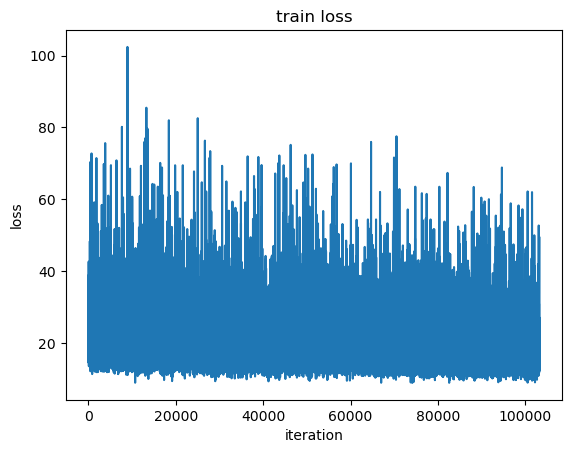

In [ ]:
loss_plot(history)